In [1]:
import gymnasium as gym
from gymnasium import spaces
from stable_baselines3 import PPO
from scipy.optimize import minimize, Bounds, LinearConstraint
import plotly.graph_objs as go

#print(torch.__version__)
print(PPO)
print(gym.__version__)


<class 'stable_baselines3.ppo.ppo.PPO'>
0.29.1


In [2]:
import streamlit as st
import pandas as pd
import requests
import numpy as np
import yfinance as yf
import matplotlib
%matplotlib inline
import random
import cvxpy as cp
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

C:\Users\brandyns pc\Projects\robo_advisors\robo_advisor\Lib\site-packages\threadpoolctl.py:1214: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)


In [3]:
import sys
print(sys.executable)

C:\Users\brandyns pc\Projects\robo_advisors\robo_advisor\scripts\python.exe


In [4]:
random.seed(42)
np.random.seed(42)

# Data Cleaning & Models

## Historical

In [5]:
tbill_path = '../data/3_month_t_bill.csv'
tbill = pd.read_csv(tbill_path)
tbill['decimal'] = tbill['TB3MS'] / 100
current_risk_free = tbill['decimal'].iloc[-1]
current_risk_free

0.0524

In [6]:
assets_path = '../data/asset_prices.csv'
assets = pd.read_csv(assets_path)
assets.dropna(inplace=True)
all_assets = assets.copy()
all_assets = all_assets[all_assets['DAY'] >= '2023-01-22']
assets = assets[assets['DAY'] >= '2023-03-22']
assets

,DAY,SYMBOL,PRICE
0,2024-05-25 00:00:00.000,AAVE,104.412857
1,2024-05-25 00:00:00.000,GFI,3.642143
2,2024-05-25 00:00:00.000,BAL,3.997857
3,2024-05-25 00:00:00.000,FRAX,0.998052
4,2024-05-25 00:00:00.000,RSR,0.008933
...,...,...,...
12063,2023-03-22 00:00:00.000,MPL,4.599309
12064,2023-03-22 00:00:00.000,ENS,14.050374
12065,2023-03-22 00:00:00.000,PAXG,1959.606273
12066,2023-03-22 00:00:00.000,USDC,1.003244


In [7]:
all_assets_pivot = all_assets.pivot(index='DAY', columns='SYMBOL', values='PRICE').reset_index()
all_assets_pivot.set_index('DAY', inplace=True)
all_assets_pivot.columns = [f'DAILY_PRICE_{col}' for col in all_assets_pivot.columns]
all_assets_pivot

,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,DAILY_PRICE_RETH,DAILY_PRICE_RPL,DAILY_PRICE_RSR,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC,DAILY_PRICE_WBTC,DAILY_PRICE_WETH,DAILY_PRICE_WSTETH
DAY,,,,,,,,,,,,,,,,,,,,,
2023-01-22 00:00:00.000,86.026914,0.006462,6.921808,0.024866,0.014425,77.805422,52.000952,459.213068,83.477768,14.669329,...,1652.606977,35.469398,0.004200,12.482600,0.620903,4.708196,1.000434,22783.328348,1632.345526,1800.156377
2023-01-23 00:00:00.000,86.672137,0.006462,6.940448,0.024872,0.015137,77.805422,52.350294,459.091330,84.322792,14.902668,...,1646.442349,35.468324,0.004323,12.217791,0.636852,4.732913,0.999869,22750.074961,1630.674473,1799.058410
2023-01-24 00:00:00.000,85.981641,0.006462,6.938768,0.024868,0.016605,77.805422,51.541324,462.321224,84.115264,14.871381,...,1599.296149,39.176504,0.004567,12.254735,0.649635,4.652931,1.000223,22932.901060,1626.390236,1796.258220
2023-01-25 00:00:00.000,81.389200,0.006462,6.710481,0.024862,0.015850,75.862089,49.392540,456.044609,79.606103,13.987802,...,1544.883037,37.175419,0.004259,11.671734,0.594947,4.413676,1.000291,22609.103191,1553.676800,1715.579150
2023-01-26 00:00:00.000,86.833093,0.006462,6.937327,0.024871,0.016519,77.805422,51.813935,464.157226,83.079416,15.115527,...,1614.193220,39.415002,0.004450,12.263251,0.641346,4.583892,0.999656,23024.863338,1609.831241,1776.394800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-21 00:00:00.000,97.714583,1.168750,3.937917,0.023344,0.028174,74.599583,60.737917,1418.450833,112.146250,19.973750,...,4055.058333,20.907500,0.008969,181.532917,0.469050,9.117292,1.008328,70675.333333,3715.164167,4329.551250
2024-05-22 00:00:00.000,95.806667,1.161667,3.955833,0.023342,0.027681,75.427917,61.299167,1402.986250,110.888333,21.544167,...,4075.529375,22.028750,0.008499,179.265833,0.462505,9.371042,1.008473,70024.833333,3753.440417,4378.418333
2024-05-23 00:00:00.000,95.547500,1.183333,3.977917,0.023335,0.026976,76.242083,60.161250,1381.429167,109.649583,22.845417,...,4128.811875,21.784583,0.008223,175.817083,0.495973,9.414375,1.008446,68898.750000,3790.045417,4423.828750


In [8]:
all_assets_pivot.describe()

,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,DAILY_PRICE_RETH,DAILY_PRICE_RPL,DAILY_PRICE_RSR,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC,DAILY_PRICE_WBTC,DAILY_PRICE_WETH,DAILY_PRICE_WSTETH
count,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,...,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000
mean,82.723250,0.664711,4.714128,0.024707,0.019621,74.019333,51.912132,722.569591,86.736580,12.933196,...,2319.598106,32.803776,0.003624,43.227927,0.621814,4.976049,1.000408,37877.600849,2177.009428,2487.122450
std,19.249789,0.398559,1.239972,0.000669,0.006017,6.170889,13.116041,276.586922,22.169012,5.114953,...,726.929585,9.559038,0.002012,54.121159,0.138693,2.423965,0.008760,14949.919981,639.303640,765.031021
min,50.022408,0.006462,2.952997,0.022889,0.011172,54.072601,26.347087,403.162650,55.070585,6.771591,...,1447.549251,17.945681,0.001692,7.281786,0.392057,2.724123,0.936897,20006.940559,1414.017137,1572.772765
25%,66.609622,0.477821,3.678210,0.024881,0.014794,71.914566,42.319364,558.530382,69.859505,8.731714,...,1815.114405,25.276404,0.002169,10.485865,0.528197,3.585662,0.999791,26962.718638,1716.643252,1937.588106
50%,81.725865,0.583191,4.371881,0.024939,0.018892,77.805422,51.652452,598.307136,82.820877,11.698894,...,1998.823196,30.256888,0.002868,12.338072,0.595637,4.228011,1.000096,30152.701695,1887.050305,2127.881432
75%,94.541807,0.920131,5.498862,0.025040,0.023282,77.805422,57.047334,735.721418,96.967365,15.611340,...,2473.873486,40.511434,0.004322,50.294304,0.696820,4.736420,1.000666,43684.324721,2379.003864,2739.777501
max,142.770288,2.122444,7.403282,0.025248,0.037769,80.623318,95.527355,1457.749344,155.383069,26.035691,...,4308.763865,58.146728,0.011676,203.107650,1.234352,14.253906,1.168350,72481.945723,4012.338527,4646.838862


In [9]:

# Assuming 'assets' data is loaded into a DataFrame called assets_df

# Convert 'DAY' to datetime
assets['DAY'] = pd.to_datetime(assets['DAY'])

# Pivot the data to have symbols as columns
pivot_assets = assets.pivot(index='DAY', columns='SYMBOL', values='PRICE').reset_index()

# Display the pivoted DataFrame
print(pivot_assets.head())
pivot_assets.set_index('DAY', inplace=True)

SYMBOL        DAY       AAVE       ARB       BAL      CDAI      CELR  \
0      2023-03-22  77.975523  0.006462  6.710767  0.024903  0.023727   
1      2023-03-23  76.986636  0.505656  6.753712  0.024915  0.025599   
2      2023-03-24  75.511135  0.697293  6.829789  0.024899  0.026932   
3      2023-03-25  72.566533  0.628270  6.634257  0.024908  0.027295   
4      2023-03-26  72.438745  0.639049  6.734250  0.024907  0.027161   

SYMBOL       CETH       COMP       CWBTC        DPI  ...         RETH  \
0       77.805422  44.450791  567.320952  82.766938  ...  1860.236441   
1       77.805422  43.605129  560.852275  80.793823  ...  1860.731660   
2       77.805422  43.497305  565.525788  79.682526  ...  1872.544553   
3       77.805422  42.287877  555.763063  76.922269  ...  1811.265272   
4       74.282316  42.639852  559.364323  77.132662  ...  1838.307005   

SYMBOL        RPL       RSR        SOL       STG       UNI      USDC  \
0       40.281294  0.004006  11.204386  0.725148  4.3906

In [10]:
pivot_assets.columns = [f'DAILY_PRICE_{col}' for col in pivot_assets.columns]
pivot_assets = pivot_assets.reset_index()
pivot_assets

,DAY,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,...,DAILY_PRICE_RETH,DAILY_PRICE_RPL,DAILY_PRICE_RSR,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC,DAILY_PRICE_WBTC,DAILY_PRICE_WETH,DAILY_PRICE_WSTETH
0,2023-03-22,77.975523,0.006462,6.710767,0.024903,0.023727,77.805422,44.450791,567.320952,82.766938,...,1860.236441,40.281294,0.004006,11.204386,0.725148,4.390639,1.003244,28242.550720,1795.875979,2001.498894
1,2023-03-23,76.986636,0.505656,6.753712,0.024915,0.025599,77.805422,43.605129,560.852275,80.793823,...,1860.731660,39.393418,0.003980,11.033410,0.699607,4.316536,1.005769,27923.248918,1779.473314,1982.945523
2,2023-03-24,75.511135,0.697293,6.829789,0.024899,0.026932,77.805422,43.497305,565.525788,79.682526,...,1872.544553,39.504500,0.004083,10.749715,0.691989,4.226087,1.004327,28160.865007,1793.660846,1998.185406
3,2023-03-25,72.566533,0.628270,6.634257,0.024908,0.027295,77.805422,42.287877,555.763063,76.922269,...,1811.265272,38.276613,0.003912,10.431255,0.652744,4.085916,1.005084,27700.575914,1756.957366,1957.459550
4,2023-03-26,72.438745,0.639049,6.734250,0.024907,0.027161,74.282316,42.639852,559.364323,77.132662,...,1838.307005,40.649177,0.003881,10.437508,0.651940,4.013525,1.003584,27846.500985,1768.893841,1972.497580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426,2024-05-21,97.714583,1.168750,3.937917,0.023344,0.028174,74.599583,60.737917,1418.450833,112.146250,...,4055.058333,20.907500,0.008969,181.532917,0.469050,9.117292,1.008328,70675.333333,3715.164167,4329.551250
427,2024-05-22,95.806667,1.161667,3.955833,0.023342,0.027681,75.427917,61.299167,1402.986250,110.888333,...,4075.529375,22.028750,0.008499,179.265833,0.462505,9.371042,1.008473,70024.833333,3753.440417,4378.418333
428,2024-05-23,95.547500,1.183333,3.977917,0.023335,0.026976,76.242083,60.161250,1381.429167,109.649583,...,4128.811875,21.784583,0.008223,175.817083,0.495973,9.414375,1.008446,68898.750000,3790.045417,4423.828750
429,2024-05-24,98.117083,1.173750,3.937917,0.023359,0.026056,75.003750,59.483333,1361.557917,110.742500,...,4080.743125,22.257083,0.008776,168.656250,0.500272,9.309167,1.004325,67889.458333,3731.083750,4356.560417


In [11]:
panamadao_path = '../data/panamadao_returns.csv'
panamadao_returns = pd.read_csv(panamadao_path)
panamadao_returns.dropna(inplace=True)
panamadao_returns

,DAY,SYMBOL,TOTAL_FILLED_BALANCE,DAILY_PRICE,TOTAL_VALUE_IN_USD,TOTAL_USD_IN_TREASURY,COMPOSITION
0,2023-03-22 00:00:00.000,ETH,0.100000,1743.360000,174.336000,174.336000,1.000000
1,2023-03-22 00:00:00.000,USDC,0.000000,1.000000,0.000000,174.336000,0.000000
2,2023-03-22 00:00:00.000,WETH,0.000000,1743.360000,0.000000,174.336000,0.000000
3,2023-03-23 00:00:00.000,ETH,0.140000,1825.050000,255.507000,255.507000,1.000000
4,2023-03-23 00:00:00.000,USDC,0.000000,1.000000,0.000000,255.507000,0.000000
...,...,...,...,...,...,...,...
1258,2024-05-14 00:00:00.000,USDC,270.659535,0.999893,270.630574,32341.145506,0.008368
1259,2024-05-14 00:00:00.000,WETH,0.001900,2881.980000,5.475762,32341.145506,0.000169
1260,2024-05-15 00:00:00.000,ETH,11.230723,3021.480000,33933.404930,34209.805277,0.991920
1261,2024-05-15 00:00:00.000,USDC,270.659535,1.000000,270.659535,34209.805277,0.007912


In [12]:
panama_dao_assets = panamadao_returns['SYMBOL'].unique()

# Convert 'DAY' to datetime
panamadao_returns['DAY'] = pd.to_datetime(panamadao_returns['DAY'])

# Sort by 'DAY' and 'SYMBOL'
panamadao_returns = panamadao_returns.sort_values(by=['DAY', 'SYMBOL'])

# Calculate previous day price
panamadao_returns['prev_day_price'] = panamadao_returns.groupby('SYMBOL')['DAILY_PRICE'].shift(1)

# Calculate daily return
panamadao_returns['daily_return'] = (panamadao_returns['DAILY_PRICE'] - panamadao_returns['prev_day_price']) / panamadao_returns['prev_day_price']

# Calculate weighted daily return
panamadao_returns['weighted_daily_return1'] = panamadao_returns['daily_return'] * panamadao_returns['COMPOSITION']

# Filter dates after '2023-07-01'
filtered_returns = panamadao_returns

# Calculate weighted daily return per day
weighted_daily_returns = filtered_returns.groupby('DAY').apply(lambda x: (x['daily_return'] * x['COMPOSITION']).sum()).reset_index(name='weighted_daily_return')

# Calculate cumulative returns
weighted_daily_returns['daily_factor'] = 1 + weighted_daily_returns['weighted_daily_return']
weighted_daily_returns['cumulative_return'] = (np.exp(np.log(weighted_daily_returns['daily_factor']).cumsum()) - 1)

# Calculate metrics
average_daily_return = weighted_daily_returns['weighted_daily_return'].mean()
stddev_daily_return = weighted_daily_returns['weighted_daily_return'].std()

# Calculate Sharpe ratio
annualized_return = average_daily_return * 365
annualized_risk = stddev_daily_return * np.sqrt(365)
sharpe_ratio = (annualized_return - current_risk_free) / annualized_risk

# Prepare base return
base_return = weighted_daily_returns[['DAY', 'cumulative_return']].copy()
base_return = base_return.dropna().rename(columns={'cumulative_return': 'base_cumulative_return'})

# Combine results
combined = base_return[['DAY', 'base_cumulative_return']].sort_values('DAY')

# Normalize returns
first_value = combined['base_cumulative_return'].iloc[0]
combined['PanamaDAO_treasury_return'] = 100 + (100 * (combined['base_cumulative_return'] - first_value))

# Final output
historical_normalized_returns = combined[['DAY', 'PanamaDAO_treasury_return']]

print(historical_normalized_returns)

In [13]:


# Convert 'DAY' to datetime
panamadao_returns['DAY'] = pd.to_datetime(panamadao_returns['DAY'])

# Sort by 'DAY' and 'SYMBOL'
panamadao_returns = panamadao_returns.sort_values(by=['DAY', 'SYMBOL'])

# Calculate previous day price
panamadao_returns['prev_day_price'] = panamadao_returns.groupby('SYMBOL')['DAILY_PRICE'].shift(1)

# Calculate daily log return
panamadao_returns['daily_log_return'] = np.log(panamadao_returns['DAILY_PRICE'] / panamadao_returns['prev_day_price'])

# Calculate weighted daily log return
panamadao_returns['weighted_daily_return'] = panamadao_returns['daily_log_return'] * panamadao_returns['COMPOSITION']

# Filter dates after '2023-07-01'
filtered_returns = panamadao_returns

# Calculate weighted daily log return per day
weighted_daily_log_returns = filtered_returns.groupby('DAY').apply(lambda x: x['weighted_daily_return'].sum()).reset_index(name='weighted_daily_return')

# Calculate cumulative log returns
weighted_daily_log_returns['cumulative_log_return'] = weighted_daily_log_returns['weighted_daily_return'].cumsum()

# Calculate cumulative returns from cumulative log returns
weighted_daily_log_returns['cumulative_return'] = np.exp(weighted_daily_log_returns['cumulative_log_return']) - 1



# Calculate metrics
average_daily_log_return = weighted_daily_log_returns['weighted_daily_return'].mean()
stddev_daily_log_return = weighted_daily_log_returns['weighted_daily_return'].std()

# Calculate Sharpe ratio
annualized_return = average_daily_log_return * 365
annualized_risk = stddev_daily_log_return * np.sqrt(365)
sharpe_ratio = (annualized_return - current_risk_free) / annualized_risk

# Prepare base return
base_return = weighted_daily_log_returns[['DAY', 'cumulative_return']].copy()
base_return = base_return.dropna().rename(columns={'cumulative_return': 'base_cumulative_return'})

# Combine results
combined = base_return[['DAY', 'base_cumulative_return']].sort_values('DAY')

# Normalize returns
first_value = combined['base_cumulative_return'].iloc[0]
combined['PanamaDAO_treasury_return'] = 100 + (100 * (combined['base_cumulative_return'] - first_value))

# Final output
historical_normalized_returns = combined[['DAY', 'PanamaDAO_treasury_return']]

print(historical_normalized_returns)


           DAY  PanamaDAO_treasury_return
0   2023-03-22                 100.000000
1   2023-03-23                 104.685779
2   2023-03-24                 101.257342
3   2023-03-25                 100.418732
4   2023-03-26                 102.108572
..         ...                        ...
416 2024-05-11                 166.762449
417 2024-05-12                 167.617162
418 2024-05-13                 168.493424
419 2024-05-14                 164.844911
420 2024-05-15                 172.759626

[421 rows x 2 columns]


C:\Users\brandyns pc\AppData\Local\Temp\ipykernel_21216\4153787489.py:20: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  weighted_daily_log_returns = filtered_returns.groupby('DAY').apply(lambda x: x['weighted_daily_return'].sum()).reset_index(name='weighted_daily_return')


In [14]:
weighted_daily_returns = weighted_daily_log_returns

In [15]:
historical_normalized_returns.set_index('DAY', inplace=True)

<Axes: xlabel='DAY'>

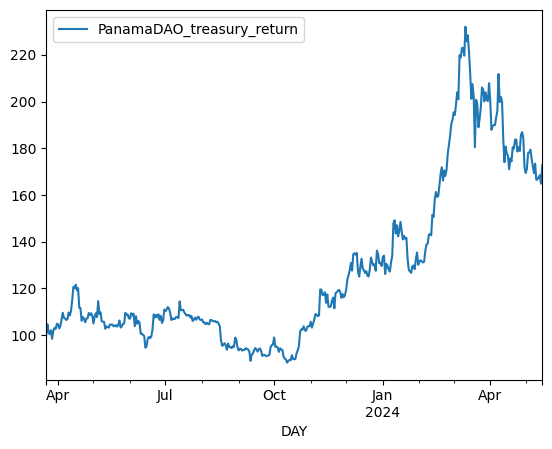

In [16]:
historical_normalized_returns.plot()

In [17]:
panamadao_returns

,DAY,SYMBOL,TOTAL_FILLED_BALANCE,DAILY_PRICE,TOTAL_VALUE_IN_USD,TOTAL_USD_IN_TREASURY,COMPOSITION,prev_day_price,daily_log_return,weighted_daily_return
0,2023-03-22,ETH,0.100000,1743.360000,174.336000,174.336000,1.000000,NaN,NaN,NaN
1,2023-03-22,USDC,0.000000,1.000000,0.000000,174.336000,0.000000,NaN,NaN,NaN
2,2023-03-22,WETH,0.000000,1743.360000,0.000000,174.336000,0.000000,NaN,NaN,NaN
3,2023-03-23,ETH,0.140000,1825.050000,255.507000,255.507000,1.000000,1743.360000,0.045793,4.579310e-02
4,2023-03-23,USDC,0.000000,1.000000,0.000000,255.507000,0.000000,1.000000,0.000000,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...
1258,2024-05-14,USDC,270.659535,0.999893,270.630574,32341.145506,0.008368,0.999938,-0.000045,-3.765916e-07
1259,2024-05-14,WETH,0.001900,2881.980000,5.475762,32341.145506,0.000169,2946.310000,-0.022076,-3.737741e-06
1260,2024-05-15,ETH,11.230723,3021.480000,33933.404930,34209.805277,0.991920,2881.980000,0.047269,4.688730e-02
1261,2024-05-15,USDC,270.659535,1.000000,270.659535,34209.805277,0.007912,0.999893,0.000107,8.466029e-07


In [18]:
pivot_data = panamadao_returns.pivot(index='DAY', columns='SYMBOL', values=['TOTAL_FILLED_BALANCE', 'DAILY_PRICE', 'TOTAL_VALUE_IN_USD', 'COMPOSITION'])
pivot_data.columns = ['_'.join(col).strip() for col in pivot_data.columns.values]
pivot_data = pivot_data.reset_index()

In [19]:
pivot_data.set_index('DAY', inplace=True)
pivot_data

,TOTAL_FILLED_BALANCE_ETH,TOTAL_FILLED_BALANCE_USDC,TOTAL_FILLED_BALANCE_WETH,DAILY_PRICE_ETH,DAILY_PRICE_USDC,DAILY_PRICE_WETH,TOTAL_VALUE_IN_USD_ETH,TOTAL_VALUE_IN_USD_USDC,TOTAL_VALUE_IN_USD_WETH,COMPOSITION_ETH,COMPOSITION_USDC,COMPOSITION_WETH
DAY,,,,,,,,,,,,
2023-03-22,0.100000,0.000000,0.0000,1743.36,1.000000,1743.36,174.336000,0.000000,0.000000,1.000000,0.000000,0.000000
2023-03-23,0.140000,0.000000,0.0000,1825.05,1.000000,1825.05,255.507000,0.000000,0.000000,1.000000,0.000000,0.000000
2023-03-24,0.437000,0.000000,0.0000,1765.28,1.010000,1765.28,771.427360,0.000000,0.000000,1.000000,0.000000,0.000000
2023-03-25,0.437000,0.000000,0.0000,1750.66,1.010000,1750.66,765.038420,0.000000,0.000000,1.000000,0.000000,0.000000
2023-03-26,0.447000,0.000000,0.0000,1780.12,0.999827,1780.12,795.713640,0.000000,0.000000,1.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-11,11.047240,270.659535,0.0019,2915.79,1.000000,2915.79,32211.431920,270.659535,5.540001,0.991498,0.008331,0.000171
2024-05-12,11.062640,270.659535,0.0019,2930.86,0.999977,2930.86,32423.049070,270.653310,5.568634,0.991553,0.008277,0.000170
2024-05-13,11.090865,270.659535,0.0019,2946.31,0.999938,2946.31,32677.126458,270.642754,5.597989,0.991617,0.008213,0.000170


In [20]:
filtered_columns = [col for col in pivot_data.columns if 'COMPOSITION_' in col or 'DAILY_PRICE_' in col]
pivot_data_filtered = pivot_data[filtered_columns]
pivot_data_filtered


,DAILY_PRICE_ETH,DAILY_PRICE_USDC,DAILY_PRICE_WETH,COMPOSITION_ETH,COMPOSITION_USDC,COMPOSITION_WETH
DAY,,,,,,
2023-03-22,1743.36,1.000000,1743.36,1.000000,0.000000,0.000000
2023-03-23,1825.05,1.000000,1825.05,1.000000,0.000000,0.000000
2023-03-24,1765.28,1.010000,1765.28,1.000000,0.000000,0.000000
2023-03-25,1750.66,1.010000,1750.66,1.000000,0.000000,0.000000
2023-03-26,1780.12,0.999827,1780.12,1.000000,0.000000,0.000000
...,...,...,...,...,...,...
2024-05-11,2915.79,1.000000,2915.79,0.991498,0.008331,0.000171
2024-05-12,2930.86,0.999977,2930.86,0.991553,0.008277,0.000170
2024-05-13,2946.31,0.999938,2946.31,0.991617,0.008213,0.000170


In [21]:
# Convert assets DataFrame to wide format
assets_pivot = assets.pivot(index='DAY', columns='SYMBOL', values='PRICE')

# Rename columns to match the format in pivot_data_filtered
assets_pivot.columns = [f'DAILY_PRICE_{col}' for col in assets_pivot.columns]
assets_pivot.index

DatetimeIndex(['2023-03-22', '2023-03-23', '2023-03-24', '2023-03-25',
               '2023-03-26', '2023-03-27', '2023-03-28', '2023-03-29',
               '2023-03-30', '2023-03-31',
               ...
               '2024-05-16', '2024-05-17', '2024-05-18', '2024-05-19',
               '2024-05-20', '2024-05-21', '2024-05-22', '2024-05-23',
               '2024-05-24', '2024-05-25'],
              dtype='datetime64[ns]', name='DAY', length=431, freq=None)

In [22]:
assets_pivot

,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,DAILY_PRICE_RETH,DAILY_PRICE_RPL,DAILY_PRICE_RSR,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC,DAILY_PRICE_WBTC,DAILY_PRICE_WETH,DAILY_PRICE_WSTETH
DAY,,,,,,,,,,,,,,,,,,,,,
2023-03-22,77.975523,0.006462,6.710767,0.024903,0.023727,77.805422,44.450791,567.320952,82.766938,14.050374,...,1860.236441,40.281294,0.004006,11.204386,0.725148,4.390639,1.003244,28242.550720,1795.875979,2001.498894
2023-03-23,76.986636,0.505656,6.753712,0.024915,0.025599,77.805422,43.605129,560.852275,80.793823,13.861658,...,1860.731660,39.393418,0.003980,11.033410,0.699607,4.316536,1.005769,27923.248918,1779.473314,1982.945523
2023-03-24,75.511135,0.697293,6.829789,0.024899,0.026932,77.805422,43.497305,565.525788,79.682526,13.694048,...,1872.544553,39.504500,0.004083,10.749715,0.691989,4.226087,1.004327,28160.865007,1793.660846,1998.185406
2023-03-25,72.566533,0.628270,6.634257,0.024908,0.027295,77.805422,42.287877,555.763063,76.922269,13.289468,...,1811.265272,38.276613,0.003912,10.431255,0.652744,4.085916,1.005084,27700.575914,1756.957366,1957.459550
2023-03-26,72.438745,0.639049,6.734250,0.024907,0.027161,74.282316,42.639852,559.364323,77.132662,13.260314,...,1838.307005,40.649177,0.003881,10.437508,0.651940,4.013525,1.003584,27846.500985,1768.893841,1972.497580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-21,97.714583,1.168750,3.937917,0.023344,0.028174,74.599583,60.737917,1418.450833,112.146250,19.973750,...,4055.058333,20.907500,0.008969,181.532917,0.469050,9.117292,1.008328,70675.333333,3715.164167,4329.551250
2024-05-22,95.806667,1.161667,3.955833,0.023342,0.027681,75.427917,61.299167,1402.986250,110.888333,21.544167,...,4075.529375,22.028750,0.008499,179.265833,0.462505,9.371042,1.008473,70024.833333,3753.440417,4378.418333
2024-05-23,95.547500,1.183333,3.977917,0.023335,0.026976,76.242083,60.161250,1381.429167,109.649583,22.845417,...,4128.811875,21.784583,0.008223,175.817083,0.495973,9.414375,1.008446,68898.750000,3790.045417,4423.828750


In [23]:
pivot_data_filtered.index = pd.to_datetime(pivot_data_filtered.index)

In [24]:
all_assets_pivot.index = pd.to_datetime(all_assets_pivot.index)
all_assets_pivot.index

DatetimeIndex(['2023-01-22', '2023-01-23', '2023-01-24', '2023-01-25',
               '2023-01-26', '2023-01-27', '2023-01-28', '2023-01-29',
               '2023-01-30', '2023-01-31',
               ...
               '2024-05-16', '2024-05-17', '2024-05-18', '2024-05-19',
               '2024-05-20', '2024-05-21', '2024-05-22', '2024-05-23',
               '2024-05-24', '2024-05-25'],
              dtype='datetime64[ns]', name='DAY', length=490, freq=None)

In [25]:
pivot_data_filtered.index

DatetimeIndex(['2023-03-22', '2023-03-23', '2023-03-24', '2023-03-25',
               '2023-03-26', '2023-03-27', '2023-03-28', '2023-03-29',
               '2023-03-30', '2023-03-31',
               ...
               '2024-05-06', '2024-05-07', '2024-05-08', '2024-05-09',
               '2024-05-10', '2024-05-11', '2024-05-12', '2024-05-13',
               '2024-05-14', '2024-05-15'],
              dtype='datetime64[ns]', name='DAY', length=421, freq=None)

In [26]:
pivot_data_filtered.columns

Index(['DAILY_PRICE_ETH', 'DAILY_PRICE_USDC', 'DAILY_PRICE_WETH',
       'COMPOSITION_ETH', 'COMPOSITION_USDC', 'COMPOSITION_WETH'],
      dtype='object')

In [27]:
pivot_data_filtered_no_price = pivot_data_filtered.drop(columns=['DAILY_PRICE_ETH', 'DAILY_PRICE_USDC', 'DAILY_PRICE_WETH'])

combined_all_assets = all_assets_pivot.join(pivot_data_filtered_no_price,  how='left')
combined_all_assets = combined_all_assets[combined_all_assets.index <= '2024-05-15']
combined_all_assets

,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC,DAILY_PRICE_WBTC,DAILY_PRICE_WETH,DAILY_PRICE_WSTETH,COMPOSITION_ETH,COMPOSITION_USDC,COMPOSITION_WETH
DAY,,,,,,,,,,,,,,,,,,,,,
2023-01-22,86.026914,0.006462,6.921808,0.024866,0.014425,77.805422,52.000952,459.213068,83.477768,14.669329,...,12.482600,0.620903,4.708196,1.000434,22783.328348,1632.345526,1800.156377,NaN,NaN,NaN
2023-01-23,86.672137,0.006462,6.940448,0.024872,0.015137,77.805422,52.350294,459.091330,84.322792,14.902668,...,12.217791,0.636852,4.732913,0.999869,22750.074961,1630.674473,1799.058410,NaN,NaN,NaN
2023-01-24,85.981641,0.006462,6.938768,0.024868,0.016605,77.805422,51.541324,462.321224,84.115264,14.871381,...,12.254735,0.649635,4.652931,1.000223,22932.901060,1626.390236,1796.258220,NaN,NaN,NaN
2023-01-25,81.389200,0.006462,6.710481,0.024862,0.015850,75.862089,49.392540,456.044609,79.606103,13.987802,...,11.671734,0.594947,4.413676,1.000291,22609.103191,1553.676800,1715.579150,NaN,NaN,NaN
2023-01-26,86.833093,0.006462,6.937327,0.024871,0.016519,77.805422,51.813935,464.157226,83.079416,15.115527,...,12.263251,0.641346,4.583892,0.999656,23024.863338,1609.831241,1776.394800,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-11,83.457847,1.000032,3.422089,0.023266,0.027118,58.587875,53.966144,1222.938708,92.580027,14.012730,...,145.270884,0.465580,7.128672,0.999440,60892.619910,2915.597823,3398.573921,0.991498,0.008331,0.000171
2024-05-12,83.008768,1.001073,3.415458,0.023276,0.026459,58.749831,54.094502,1226.698195,92.848658,13.956019,...,145.865957,0.470687,7.126533,0.999292,61107.113179,2923.630833,3407.611226,0.991553,0.008277,0.000170
2024-05-13,83.177926,0.986348,3.412545,0.023281,0.025333,59.088438,54.958834,1249.763695,92.017490,13.786377,...,144.946969,0.459779,7.059514,1.004403,62181.869471,2939.990888,3426.866016,0.991617,0.008213,0.000170


In [28]:
all_assets_pivot.index

DatetimeIndex(['2023-01-22', '2023-01-23', '2023-01-24', '2023-01-25',
               '2023-01-26', '2023-01-27', '2023-01-28', '2023-01-29',
               '2023-01-30', '2023-01-31',
               ...
               '2024-05-16', '2024-05-17', '2024-05-18', '2024-05-19',
               '2024-05-20', '2024-05-21', '2024-05-22', '2024-05-23',
               '2024-05-24', '2024-05-25'],
              dtype='datetime64[ns]', name='DAY', length=490, freq=None)

In [29]:
pivot_data_filtered_no_price.index

DatetimeIndex(['2023-03-22', '2023-03-23', '2023-03-24', '2023-03-25',
               '2023-03-26', '2023-03-27', '2023-03-28', '2023-03-29',
               '2023-03-30', '2023-03-31',
               ...
               '2024-05-06', '2024-05-07', '2024-05-08', '2024-05-09',
               '2024-05-10', '2024-05-11', '2024-05-12', '2024-05-13',
               '2024-05-14', '2024-05-15'],
              dtype='datetime64[ns]', name='DAY', length=421, freq=None)

In [30]:
combined_all_assets

,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC,DAILY_PRICE_WBTC,DAILY_PRICE_WETH,DAILY_PRICE_WSTETH,COMPOSITION_ETH,COMPOSITION_USDC,COMPOSITION_WETH
DAY,,,,,,,,,,,,,,,,,,,,,
2023-01-22,86.026914,0.006462,6.921808,0.024866,0.014425,77.805422,52.000952,459.213068,83.477768,14.669329,...,12.482600,0.620903,4.708196,1.000434,22783.328348,1632.345526,1800.156377,NaN,NaN,NaN
2023-01-23,86.672137,0.006462,6.940448,0.024872,0.015137,77.805422,52.350294,459.091330,84.322792,14.902668,...,12.217791,0.636852,4.732913,0.999869,22750.074961,1630.674473,1799.058410,NaN,NaN,NaN
2023-01-24,85.981641,0.006462,6.938768,0.024868,0.016605,77.805422,51.541324,462.321224,84.115264,14.871381,...,12.254735,0.649635,4.652931,1.000223,22932.901060,1626.390236,1796.258220,NaN,NaN,NaN
2023-01-25,81.389200,0.006462,6.710481,0.024862,0.015850,75.862089,49.392540,456.044609,79.606103,13.987802,...,11.671734,0.594947,4.413676,1.000291,22609.103191,1553.676800,1715.579150,NaN,NaN,NaN
2023-01-26,86.833093,0.006462,6.937327,0.024871,0.016519,77.805422,51.813935,464.157226,83.079416,15.115527,...,12.263251,0.641346,4.583892,0.999656,23024.863338,1609.831241,1776.394800,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-11,83.457847,1.000032,3.422089,0.023266,0.027118,58.587875,53.966144,1222.938708,92.580027,14.012730,...,145.270884,0.465580,7.128672,0.999440,60892.619910,2915.597823,3398.573921,0.991498,0.008331,0.000171
2024-05-12,83.008768,1.001073,3.415458,0.023276,0.026459,58.749831,54.094502,1226.698195,92.848658,13.956019,...,145.865957,0.470687,7.126533,0.999292,61107.113179,2923.630833,3407.611226,0.991553,0.008277,0.000170
2024-05-13,83.177926,0.986348,3.412545,0.023281,0.025333,59.088438,54.958834,1249.763695,92.017490,13.786377,...,144.946969,0.459779,7.059514,1.004403,62181.869471,2939.990888,3426.866016,0.991617,0.008213,0.000170


In [31]:
assets_pivot_smaller_assets = assets_pivot.drop(columns=['DAILY_PRICE_USDC','DAILY_PRICE_WETH'])


In [32]:
# Merge the two DataFrames on the 'DAY' index
combined_data1 = pivot_data_filtered.merge(assets_pivot_smaller_assets, left_index=True, right_index=True, how='left')

combined_data1



,DAILY_PRICE_ETH,DAILY_PRICE_USDC,DAILY_PRICE_WETH,COMPOSITION_ETH,COMPOSITION_USDC,COMPOSITION_WETH,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,...,DAILY_PRICE_PAXG,DAILY_PRICE_REN,DAILY_PRICE_RETH,DAILY_PRICE_RPL,DAILY_PRICE_RSR,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_WBTC,DAILY_PRICE_WSTETH
DAY,,,,,,,,,,,,,,,,,,,,,
2023-03-22,1743.36,1.000000,1743.36,1.000000,0.000000,0.000000,77.975523,0.006462,6.710767,0.024903,...,1959.606273,0.113012,1860.236441,40.281294,0.004006,11.204386,0.725148,4.390639,28242.550720,2001.498894
2023-03-23,1825.05,1.000000,1825.05,1.000000,0.000000,0.000000,76.986636,0.505656,6.753712,0.024915,...,1995.778195,0.108756,1860.731660,39.393418,0.003980,11.033410,0.699607,4.316536,27923.248918,1982.945523
2023-03-24,1765.28,1.010000,1765.28,1.000000,0.000000,0.000000,75.511135,0.697293,6.829789,0.024899,...,1998.963159,0.105492,1872.544553,39.504500,0.004083,10.749715,0.691989,4.226087,28160.865007,1998.185406
2023-03-25,1750.66,1.010000,1750.66,1.000000,0.000000,0.000000,72.566533,0.628270,6.634257,0.024908,...,2003.730750,0.100273,1811.265272,38.276613,0.003912,10.431255,0.652744,4.085916,27700.575914,1957.459550
2023-03-26,1780.12,0.999827,1780.12,1.000000,0.000000,0.000000,72.438745,0.639049,6.734250,0.024907,...,2002.904969,0.100177,1838.307005,40.649177,0.003881,10.437508,0.651940,4.013525,27846.500985,1972.497580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-11,2915.79,1.000000,2915.79,0.991498,0.008331,0.000171,83.457847,1.000032,3.422089,0.023266,...,2339.837522,0.057705,3266.532496,19.339806,0.006210,145.270884,0.465580,7.128672,60892.619910,3398.573921
2024-05-12,2930.86,0.999977,2930.86,0.991553,0.008277,0.000170,83.008768,1.001073,3.415458,0.023276,...,2339.028436,0.055651,3229.962455,19.705780,0.006077,145.865957,0.470687,7.126533,61107.113179,3407.611226
2024-05-13,2946.31,0.999938,2946.31,0.991617,0.008213,0.000170,83.177926,0.986348,3.412545,0.023281,...,2334.786800,0.054567,3224.380157,19.769431,0.005958,144.946969,0.459779,7.059514,62181.869471,3426.866016


In [33]:
for asset in assets['SYMBOL'].unique():
    comp_col = f'COMPOSITION_{asset}'
    if comp_col not in combined_all_assets.columns:
        combined_all_assets[comp_col] = 0.0

In [34]:
# Initialize the composition columns for new assets with zeros
for asset in assets['SYMBOL'].unique():
    comp_col = f'COMPOSITION_{asset}'
    if comp_col not in combined_data1.columns:
        combined_data1[comp_col] = 0.0

combined_data1

,DAILY_PRICE_ETH,DAILY_PRICE_USDC,DAILY_PRICE_WETH,COMPOSITION_ETH,COMPOSITION_USDC,COMPOSITION_WETH,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,...,COMPOSITION_RPL,COMPOSITION_CELR,COMPOSITION_UNI,COMPOSITION_COMP,COMPOSITION_PAXG,COMPOSITION_WSTETH,COMPOSITION_G,COMPOSITION_CWBTC,COMPOSITION_CDAI,COMPOSITION_STG
DAY,,,,,,,,,,,,,,,,,,,,,
2023-03-22,1743.36,1.000000,1743.36,1.000000,0.000000,0.000000,77.975523,0.006462,6.710767,0.024903,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-03-23,1825.05,1.000000,1825.05,1.000000,0.000000,0.000000,76.986636,0.505656,6.753712,0.024915,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-03-24,1765.28,1.010000,1765.28,1.000000,0.000000,0.000000,75.511135,0.697293,6.829789,0.024899,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-03-25,1750.66,1.010000,1750.66,1.000000,0.000000,0.000000,72.566533,0.628270,6.634257,0.024908,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-03-26,1780.12,0.999827,1780.12,1.000000,0.000000,0.000000,72.438745,0.639049,6.734250,0.024907,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-11,2915.79,1.000000,2915.79,0.991498,0.008331,0.000171,83.457847,1.000032,3.422089,0.023266,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-05-12,2930.86,0.999977,2930.86,0.991553,0.008277,0.000170,83.008768,1.001073,3.415458,0.023276,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-05-13,2946.31,0.999938,2946.31,0.991617,0.008213,0.000170,83.177926,0.986348,3.412545,0.023281,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [35]:
all_assets = ['ETH', 'USDC', 'WETH', 'DPI', 'PAXG', 'RETH', 'SOL', 'WBTC', 'WSTETH']

# Construct the column names for compositions and daily prices
composition_columns = [f'COMPOSITION_{asset}' for asset in all_assets]
price_columns = [f'DAILY_PRICE_{asset}' for asset in all_assets]

# Combine the columns to filter
required_columns = composition_columns + price_columns

# Filter the combined_data1 DataFrame for the required columns
filtered_combined_data1 = combined_data1[required_columns]

# Print the first few rows to verify
print(filtered_combined_data1.head())

            COMPOSITION_ETH  COMPOSITION_USDC  COMPOSITION_WETH  \
DAY                                                               
2023-03-22              1.0               0.0               0.0   
2023-03-23              1.0               0.0               0.0   
2023-03-24              1.0               0.0               0.0   
2023-03-25              1.0               0.0               0.0   
2023-03-26              1.0               0.0               0.0   

            COMPOSITION_DPI  COMPOSITION_PAXG  COMPOSITION_RETH  \
DAY                                                               
2023-03-22              0.0               0.0               0.0   
2023-03-23              0.0               0.0               0.0   
2023-03-24              0.0               0.0               0.0   
2023-03-25              0.0               0.0               0.0   
2023-03-26              0.0               0.0               0.0   

            COMPOSITION_SOL  COMPOSITION_WBTC  COMPOSITION_W

In [36]:
combined_data1.to_csv('combined_data.csv')

In [37]:
weighted_daily_returns

,DAY,weighted_daily_return,cumulative_log_return,cumulative_return
0,2023-03-22,0.000000,0.000000,0.000000
1,2023-03-23,0.045793,0.045793,0.046858
2,2023-03-24,-0.033298,0.012495,0.012573
3,2023-03-25,-0.008316,0.004179,0.004187
4,2023-03-26,0.016688,0.020866,0.021086
...,...,...,...,...
416,2024-05-11,0.001765,0.511400,0.667624
417,2024-05-12,0.005112,0.516512,0.676172
418,2024-05-13,0.005214,0.521727,0.684934
419,2024-05-14,-0.021892,0.499835,0.648449


In [38]:
current_risk_free

0.0524

In [39]:
weighted_daily_returns.set_index('DAY', inplace=True)

In [40]:
historical_returns = weighted_daily_returns['weighted_daily_return']

def sortino(returns, risk_free=current_risk_free):
    # Calculate the downside risk
    daily_risk_free = (1 + risk_free)**(1/365) - 1

    target_return = daily_risk_free  # This is typically set to zero
    downside_returns = returns[returns < target_return]
    downside_risk = np.sqrt(np.mean(downside_returns**2))

    # Calculate the expected return
    expected_return = returns.mean()

    # Annualize the expected return and downside risk
    trading_days_per_year = 365
    annualized_return = expected_return * trading_days_per_year
    annualized_downside_risk = downside_risk * np.sqrt(trading_days_per_year)

    # Compute the Sortino ratio
    sortino_ratio = (annualized_return - target_return) / annualized_downside_risk

    # Output the Sortino ratio
    print(f"Sortino Ratio: {sortino_ratio}")
    return sortino_ratio

sortino(historical_returns)

Sortino Ratio: 0.9775199279474969


0.9775199279474969

<Axes: xlabel='DAY'>

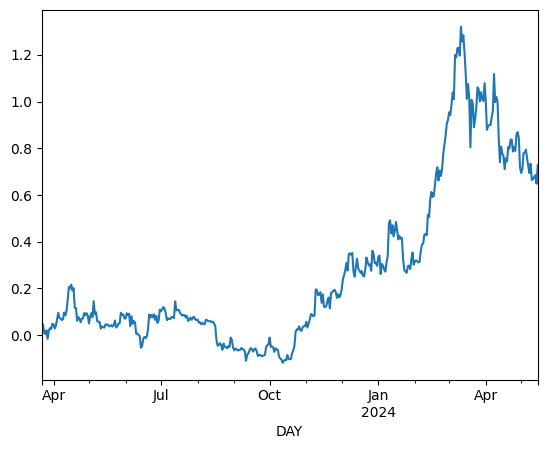

In [41]:
historical_cumulative_return = weighted_daily_returns['cumulative_return']
historical_cumulative_return.plot()

In [42]:
combined_data = pivot_data.merge(pivot_assets, on='DAY', how='left')
combined_data.set_index('DAY', inplace=True)
combined_data

,TOTAL_FILLED_BALANCE_ETH,TOTAL_FILLED_BALANCE_USDC,TOTAL_FILLED_BALANCE_WETH,DAILY_PRICE_ETH,DAILY_PRICE_USDC_x,DAILY_PRICE_WETH_x,TOTAL_VALUE_IN_USD_ETH,TOTAL_VALUE_IN_USD_USDC,TOTAL_VALUE_IN_USD_WETH,COMPOSITION_ETH,...,DAILY_PRICE_RETH,DAILY_PRICE_RPL,DAILY_PRICE_RSR,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC_y,DAILY_PRICE_WBTC,DAILY_PRICE_WETH_y,DAILY_PRICE_WSTETH
DAY,,,,,,,,,,,,,,,,,,,,,
2023-03-22,0.100000,0.000000,0.0000,1743.36,1.000000,1743.36,174.336000,0.000000,0.000000,1.000000,...,1860.236441,40.281294,0.004006,11.204386,0.725148,4.390639,1.003244,28242.550720,1795.875979,2001.498894
2023-03-23,0.140000,0.000000,0.0000,1825.05,1.000000,1825.05,255.507000,0.000000,0.000000,1.000000,...,1860.731660,39.393418,0.003980,11.033410,0.699607,4.316536,1.005769,27923.248918,1779.473314,1982.945523
2023-03-24,0.437000,0.000000,0.0000,1765.28,1.010000,1765.28,771.427360,0.000000,0.000000,1.000000,...,1872.544553,39.504500,0.004083,10.749715,0.691989,4.226087,1.004327,28160.865007,1793.660846,1998.185406
2023-03-25,0.437000,0.000000,0.0000,1750.66,1.010000,1750.66,765.038420,0.000000,0.000000,1.000000,...,1811.265272,38.276613,0.003912,10.431255,0.652744,4.085916,1.005084,27700.575914,1756.957366,1957.459550
2023-03-26,0.447000,0.000000,0.0000,1780.12,0.999827,1780.12,795.713640,0.000000,0.000000,1.000000,...,1838.307005,40.649177,0.003881,10.437508,0.651940,4.013525,1.003584,27846.500985,1768.893841,1972.497580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-11,11.047240,270.659535,0.0019,2915.79,1.000000,2915.79,32211.431920,270.659535,5.540001,0.991498,...,3266.532496,19.339806,0.006210,145.270884,0.465580,7.128672,0.999440,60892.619910,2915.597823,3398.573921
2024-05-12,11.062640,270.659535,0.0019,2930.86,0.999977,2930.86,32423.049070,270.653310,5.568634,0.991553,...,3229.962455,19.705780,0.006077,145.865957,0.470687,7.126533,0.999292,61107.113179,2923.630833,3407.611226
2024-05-13,11.090865,270.659535,0.0019,2946.31,0.999938,2946.31,32677.126458,270.642754,5.597989,0.991617,...,3224.380157,19.769431,0.005958,144.946969,0.459779,7.059514,1.004403,62181.869471,2939.990888,3426.866016


In [43]:
portfolio = combined_data[[col for col in combined_data.columns if 'COMPOSITION_' in col]]
asset_prices = combined_data[[col for col in combined_data.columns if 'DAILY_PRICE_' in col]]
print(portfolio)
print(asset_prices)

            COMPOSITION_ETH  COMPOSITION_USDC  COMPOSITION_WETH
DAY                                                            
2023-03-22         1.000000          0.000000          0.000000
2023-03-23         1.000000          0.000000          0.000000
2023-03-24         1.000000          0.000000          0.000000
2023-03-25         1.000000          0.000000          0.000000
2023-03-26         1.000000          0.000000          0.000000
...                     ...               ...               ...
2024-05-11         0.991498          0.008331          0.000171
2024-05-12         0.991553          0.008277          0.000170
2024-05-13         0.991617          0.008213          0.000170
2024-05-14         0.991463          0.008368          0.000169
2024-05-15         0.991920          0.007912          0.000168

[421 rows x 3 columns]
            DAILY_PRICE_ETH  DAILY_PRICE_USDC_x  DAILY_PRICE_WETH_x  \
DAY                                                                   
20

## MVO Rebalancing

In [44]:
panama_dao_start_date = panamadao_returns['DAY'].iloc[0]
panama_dao_start_date

Timestamp('2023-03-22 00:00:00')

In [45]:
combined_all_assets

,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,COMPOSITION_RPL,COMPOSITION_CELR,COMPOSITION_UNI,COMPOSITION_COMP,COMPOSITION_PAXG,COMPOSITION_WSTETH,COMPOSITION_G,COMPOSITION_CWBTC,COMPOSITION_CDAI,COMPOSITION_STG
DAY,,,,,,,,,,,,,,,,,,,,,
2023-01-22,86.026914,0.006462,6.921808,0.024866,0.014425,77.805422,52.000952,459.213068,83.477768,14.669329,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-01-23,86.672137,0.006462,6.940448,0.024872,0.015137,77.805422,52.350294,459.091330,84.322792,14.902668,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-01-24,85.981641,0.006462,6.938768,0.024868,0.016605,77.805422,51.541324,462.321224,84.115264,14.871381,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-01-25,81.389200,0.006462,6.710481,0.024862,0.015850,75.862089,49.392540,456.044609,79.606103,13.987802,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-01-26,86.833093,0.006462,6.937327,0.024871,0.016519,77.805422,51.813935,464.157226,83.079416,15.115527,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-11,83.457847,1.000032,3.422089,0.023266,0.027118,58.587875,53.966144,1222.938708,92.580027,14.012730,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-05-12,83.008768,1.001073,3.415458,0.023276,0.026459,58.749831,54.094502,1226.698195,92.848658,13.956019,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-05-13,83.177926,0.986348,3.412545,0.023281,0.025333,59.088438,54.958834,1249.763695,92.017490,13.786377,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [46]:
combined_all_assets['COMPOSITION_ETH']

DAY
2023-01-22         NaN
2023-01-23         NaN
2023-01-24         NaN
2023-01-25         NaN
2023-01-26         NaN
                ...   
2024-05-11    0.991498
2024-05-12    0.991553
2024-05-13    0.991617
2024-05-14    0.991463
2024-05-15    0.991920
Name: COMPOSITION_ETH, Length: 480, dtype: float64

In [47]:
all_assets = assets['SYMBOL'].unique()

start_data = combined_all_assets[combined_all_assets.index >= panama_dao_start_date]
composition_columns = [f'COMPOSITION_{asset}' for asset in all_assets]
starting_composition = start_data[composition_columns]


In [48]:
pivot_data_filtered.columns

Index(['DAILY_PRICE_ETH', 'DAILY_PRICE_USDC', 'DAILY_PRICE_WETH',
       'COMPOSITION_ETH', 'COMPOSITION_USDC', 'COMPOSITION_WETH'],
      dtype='object')

In [49]:
panama_dao_assets

array(['ETH', 'USDC', 'WETH'], dtype=object)

In [50]:
full_starting_composition = starting_composition.merge(pivot_data_filtered['COMPOSITION_ETH'], left_index=True, right_index=True)

In [51]:
full_starting_composition[['COMPOSITION_ETH', 'COMPOSITION_USDC', 'COMPOSITION_WETH']]

,COMPOSITION_ETH,COMPOSITION_USDC,COMPOSITION_WETH
DAY,,,
2023-03-22,1.000000,0.000000,0.000000
2023-03-23,1.000000,0.000000,0.000000
2023-03-24,1.000000,0.000000,0.000000
2023-03-25,1.000000,0.000000,0.000000
2023-03-26,1.000000,0.000000,0.000000
...,...,...,...
2024-05-11,0.991498,0.008331,0.000171
2024-05-12,0.991553,0.008277,0.000170
2024-05-13,0.991617,0.008213,0.000170


In [52]:

print('all assets', all_assets)
print('panamadao assets', panama_dao_assets)

# Combine both arrays using np.concatenate and remove duplicates using np.unique
combined_assets = np.unique(np.concatenate((all_assets, panama_dao_assets)))

print('combined assets', combined_assets)
print('panamadao assets', panama_dao_assets)


all assets ['AAVE' 'GFI' 'BAL' 'FRAX' 'RSR' 'ARB' 'MKR' 'MPL' 'DPI' 'ENS' 'WBTC'
 'CETH' 'WETH' 'REN' 'RETH' 'SOL' 'HOP' 'RPL' 'CELR' 'UNI' 'COMP' 'PAXG'
 'USDC' 'WSTETH' 'G' 'CWBTC' 'CDAI' 'STG']
panamadao assets ['ETH' 'USDC' 'WETH']
combined assets ['AAVE' 'ARB' 'BAL' 'CDAI' 'CELR' 'CETH' 'COMP' 'CWBTC' 'DPI' 'ENS' 'ETH'
 'FRAX' 'G' 'GFI' 'HOP' 'MKR' 'MPL' 'PAXG' 'REN' 'RETH' 'RPL' 'RSR' 'SOL'
 'STG' 'UNI' 'USDC' 'WBTC' 'WETH' 'WSTETH']
panamadao assets ['ETH' 'USDC' 'WETH']


In [53]:
combined_all_assets['DAILY_PRICE_USDC'] = combined_all_assets['DAILY_PRICE_USDC'].clip(upper=1.15).apply(lambda x: 1 if x > 1 else x)

In [54]:
combined_all_assets['DAILY_PRICE_USDC'].describe()

count    480.000000
mean       0.999322
std        0.003977
min        0.936897
25%        0.999788
50%        1.000000
75%        1.000000
max        1.000000
Name: DAILY_PRICE_USDC, dtype: float64

In [55]:
combined_all_assets['DAILY_PRICE_ETH'] = combined_all_assets['DAILY_PRICE_WETH']

In [56]:
prices_all_assets = combined_all_assets[[f'DAILY_PRICE_{asset}' for asset in combined_assets]]
prices_all_assets.pct_change().describe()

,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,DAILY_PRICE_RETH,DAILY_PRICE_RPL,DAILY_PRICE_RSR,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC,DAILY_PRICE_WBTC,DAILY_PRICE_WETH,DAILY_PRICE_WSTETH
count,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,...,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000,479.000000
mean,0.000492,0.163718,-0.001151,-0.000129,0.001995,0.000576,0.000793,0.002384,0.000596,0.000688,...,0.001700,-0.000537,0.001845,0.006460,0.000124,0.001605,0.000008,0.002336,0.001448,0.001563
std,0.033976,3.529909,0.025955,0.003681,0.040553,0.048095,0.038314,0.023678,0.030070,0.041601,...,0.024681,0.037338,0.046962,0.055789,0.040722,0.040667,0.004079,0.020285,0.021251,0.021297
min,-0.168086,-0.167484,-0.132124,-0.072352,-0.212967,-0.240878,-0.178694,-0.068942,-0.144848,-0.229094,...,-0.088936,-0.157118,-0.221915,-0.176359,-0.188515,-0.170267,-0.062991,-0.070843,-0.072505,-0.073619
25%,-0.017685,-0.017740,-0.013822,-0.000087,-0.019988,0.000000,-0.018412,-0.005895,-0.016795,-0.018454,...,-0.009230,-0.021034,-0.023070,-0.019968,-0.021736,-0.017110,-0.000068,-0.007505,-0.008688,-0.008647
50%,-0.000075,0.000000,-0.001161,0.000055,0.001883,0.000000,-0.000989,0.000811,0.000988,-0.000906,...,0.000117,-0.005855,0.000989,0.000383,-0.001207,-0.001389,0.000000,0.001143,0.000489,0.000602
75%,0.016488,0.016684,0.013017,0.000215,0.022915,0.000000,0.015877,0.008361,0.016283,0.015554,...,0.010749,0.014808,0.022268,0.022417,0.019640,0.015063,0.000070,0.009964,0.010166,0.009826
max,0.194784,77.250000,0.101838,0.015002,0.174463,0.243447,0.256364,0.337603,0.161824,0.396630,...,0.115331,0.158780,0.321718,0.835541,0.249192,0.388474,0.037873,0.109301,0.095278,0.096826


In [57]:
assets_to_drop = ['G', 'HOP','CELR','CDAI','CETH','REN','STG','AAVE','FRAX','MPL','RSR','BAL','ARB','ENS']
mvo_combined_assets = np.array([asset for asset in combined_assets if asset not in assets_to_drop])

mvo_combined_assets

array(['COMP', 'CWBTC', 'DPI', 'ETH', 'GFI', 'MKR', 'PAXG', 'RETH', 'RPL',
       'SOL', 'UNI', 'USDC', 'WBTC', 'WETH', 'WSTETH'], dtype='<U6')

In [58]:
iniital_composition = full_starting_composition.iloc[0]
latest_composition = full_starting_composition.iloc[-1]

<Axes: ylabel='2024-05-15 00:00:00'>

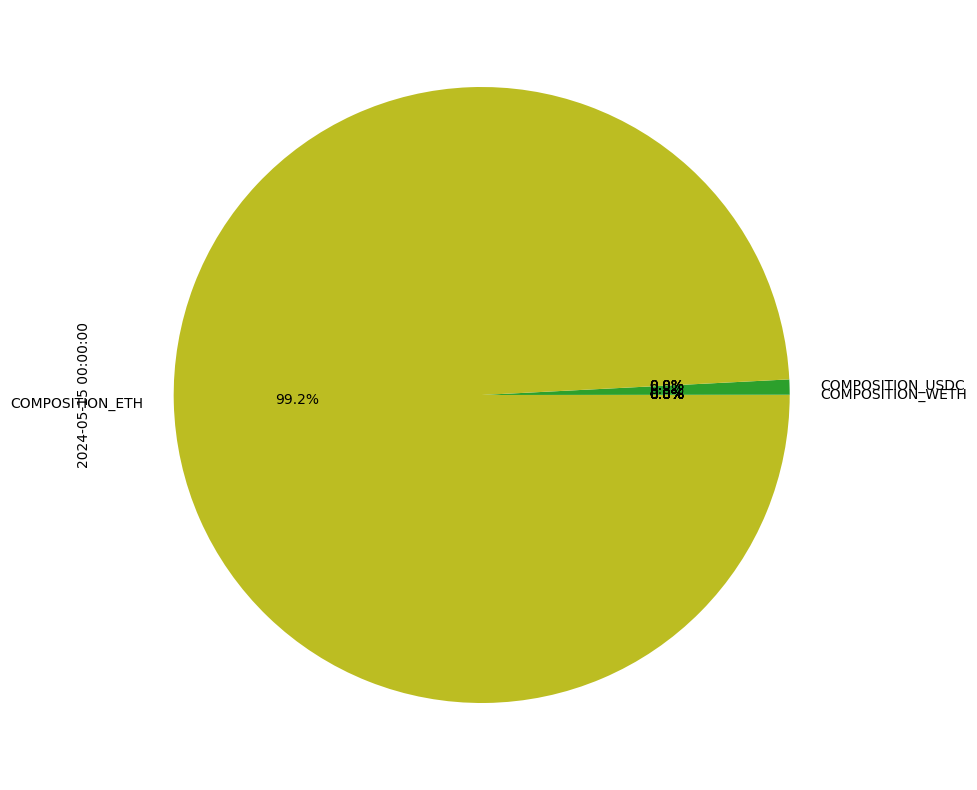

In [59]:
latest_composition.plot.pie(figsize=(10, 10), autopct='%1.1f%%')

<Axes: ylabel='2023-03-22 00:00:00'>

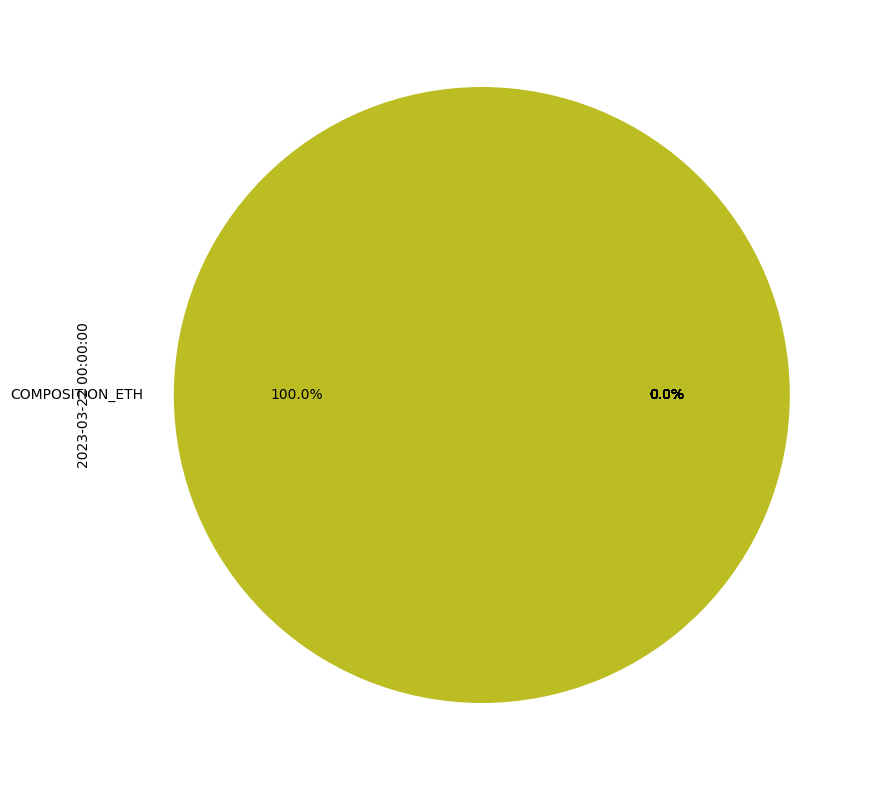

In [60]:
iniital_composition.plot.pie(figsize=(10, 10), autopct='%1.1f%%')

from notebook.services.config import ConfigManager
cm = ConfigManager()
cm.update('notebook', {
    'NotebookApp': {
        'iopub_data_rate_limit': 10000000
    }
})


In [61]:
starting_row = combined_all_assets[combined_all_assets.index >= panama_dao_start_date].iloc[0]

In [62]:
starting_row[[f'COMPOSITION_{asset}' for asset in mvo_combined_assets]]

COMPOSITION_COMP      0.0
COMPOSITION_CWBTC     0.0
COMPOSITION_DPI       0.0
COMPOSITION_ETH       1.0
COMPOSITION_GFI       0.0
COMPOSITION_MKR       0.0
COMPOSITION_PAXG      0.0
COMPOSITION_RETH      0.0
COMPOSITION_RPL       0.0
COMPOSITION_SOL       0.0
COMPOSITION_UNI       0.0
COMPOSITION_USDC      0.0
COMPOSITION_WBTC      0.0
COMPOSITION_WETH      0.0
COMPOSITION_WSTETH    0.0
Name: 2023-03-22 00:00:00, dtype: float64

## IDK if fully log

import cvxpy as cp
import numpy as np
import pandas as pd

threshold = 1e-5  # Define a very small threshold for significant changes in weights

def calculate_sortino_ratio(returns, risk_free=current_risk_free):
    print("from", returns.index.min())
    print('through', returns.index.max())
    print('returns', returns.tail())
    # Calculate daily risk-free rate
    daily_risk_free_rate = (1 + risk_free) ** (1/365) - 1

    # Calculate excess returns
    excess_returns = returns - daily_risk_free_rate

    # Calculate downside returns
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    daily_downside_deviation = np.sqrt(downside_returns.mean())

    # Handle NaN downside risk
    if np.isnan(daily_downside_deviation):
        daily_downside_deviation = 0.0

    # Compounding returns and annualizing based on the actual days with data
    active_days = returns.notna().sum()  # Using actual days with returns
    annual_factor = 365 / active_days
    compounding_return = (1 + excess_returns).prod() ** annual_factor - 1

    # Annual downside deviation
    annual_downside_deviation = daily_downside_deviation * np.sqrt(365)

    # Calculate Sortino ratios
    sortino_ratio = compounding_return / annual_downside_deviation if annual_downside_deviation != 0 else 0.0
    print('sortino ratio', sortino_ratio)

    return sortino_ratio

def mvo_sortino(returns, sortino_ratios, eth_index):
    n = returns.shape[1]
    weights = cp.Variable(n)
    portfolio_return = returns @ weights
    sortino_matrix = np.tile(sortino_ratios.values.reshape(1, -1), (len(returns), 1))
    portfolio_risk = cp.norm(returns - cp.multiply(sortino_matrix, cp.reshape(weights, (1, n))), 'fro')
    objective = cp.Maximize(cp.sum(portfolio_return))
    
    # Set constraints
    constraints = [
        cp.sum(weights) == 1,
        weights >= 0,
        weights <= 0.3
    ]
    
    # Ensure at least 20% allocation to ETH
    constraints.append(weights[eth_index] >= 0.2)
    
    problem = cp.Problem(objective, constraints)
    problem.solve(solver=cp.CLARABEL)
    return weights.value

def rebalance_portfolio(data, weights):
    compositions = np.outer(np.ones(len(data)), weights)
    return compositions

def calculate_daily_portfolio_returns(data, all_assets):
    log_returns = np.log(data[[f'DAILY_PRICE_{asset}' for asset in all_assets]].pct_change().dropna() + 1)
    composition_columns = [f'COMPOSITION_{asset}' for asset in all_assets]
    log_returns.columns = composition_columns
    daily_portfolio_returns = (log_returns * data[composition_columns].shift(1).fillna(0)).sum(axis=1)
    return daily_portfolio_returns

def calculate_cumulative_return(daily_portfolio_returns, start_date):
    daily_portfolio_returns = daily_portfolio_returns[daily_portfolio_returns.index >= start_date]
    cumulative_return = np.exp(np.log1p(daily_portfolio_returns).cumsum()) - 1
    return cumulative_return

def rebalance(data, all_assets, rebalancing_frequency=7):
    data = data.sort_index()
    rebalanced_data = data.copy()
    
    initial_composition = rebalanced_data[rebalanced_data.index >= panama_dao_start_date].iloc[0][[f'COMPOSITION_{asset}' for asset in all_assets]].values
    current_composition = initial_composition.copy()

    start_date = panama_dao_start_date

    # Find the index of the start date in the data
    start_index = data.index.get_loc(start_date)

    # Find the index of ETH in the all_assets array
    eth_index = np.where(all_assets == 'ETH')[0][0]

    for start in range(start_index, len(data)):
        end = start + 1
        period_data = data[start:end]
        
        if start % rebalancing_frequency == 0 and start != start_index:
            historical_returns = np.log(data[:start][[f'DAILY_PRICE_{asset}' for asset in all_assets]].pct_change().dropna() + 1)

            if historical_returns.shape[0] == 0 or historical_returns.shape[1] == 0:
                print(f"No returns available for historical period up to {start}")
                continue

            sortino_ratios = historical_returns.apply(calculate_sortino_ratio)

            if sortino_ratios.isnull().any():
                print(f"Sortino ratios contain NaN for historical period up to {start}")
                continue

            optimal_weights = mvo_sortino(historical_returns.values, sortino_ratios, eth_index)

            # Convert weights to standard notation for readability
            current_composition = np.round(current_composition, decimals=10)
            optimal_weights = np.round(optimal_weights, decimals=10)

            # Apply threshold to significant changes only
            weight_changes = np.abs(current_composition - optimal_weights)
            significant_changes = weight_changes >= threshold

            print(f"Period {start} to {end}:")
            print(f"  Current composition: {[f'{weight:.10f}' for weight in current_composition]}")
            print(f"  Optimal weights: {[f'{weight:.10f}' for weight in optimal_weights]}")
            print(f"  Weight changes: {[f'{change:.10f}' for change in weight_changes]}")


            if np.any(significant_changes):
                current_composition[significant_changes] = optimal_weights[significant_changes]

                # Normalize weights to ensure they sum to 1
                current_composition /= current_composition.sum()

        else:
            # Apply price changes to the current composition
            current_prices = data.iloc[start][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
            previous_prices = data.iloc[start-1][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
            log_returns = np.log(current_prices / previous_prices)
            current_composition = (current_composition * np.exp(log_returns))
            print('current_comp w/ price change', current_composition)
            current_composition /= current_composition.sum()
            print('normalized current_comp w/ price change', current_composition)

        rebalanced_data.loc[period_data.index, [f'COMPOSITION_{asset}' for asset in all_assets]] = current_composition
    
    rebalanced_data = rebalanced_data.iloc[:-1]
    
    return rebalanced_data

# Assuming combined_all_assets is already loaded and processed
all_assets = mvo_combined_assets

# Set rebalancing frequency (e.g., 1 for daily, 7 for weekly, 30 for monthly)
rebalancing_frequency = 1  # Change this to the desired frequency

# Perform rebalancing using MVO with Sortino ratio target
rebalanced_data = rebalance(combined_all_assets, all_assets, rebalancing_frequency)

# Calculate daily portfolio returns with rebalancing costs
mvo_daily_portfolio_returns = calculate_daily_portfolio_returns(rebalanced_data, all_assets)

# Calculate cumulative return for the rebalanced data from the panama_dao_start_date
cumulative_return = calculate_cumulative_return(mvo_daily_portfolio_returns, panama_dao_start_date)

# Print the first few rows of the rebalanced data and cumulative return to verify
print(rebalanced_data.head())
print(rebalanced_data.tail())

# Prepare base return
base_return = cumulative_return.reset_index()
base_return.columns = ['DAY', 'base_cumulative_return']

# Normalize returns
first_value = base_return['base_cumulative_return'].iloc[0]
base_return['PanamaDAO_treasury_return'] = 100 + (100 * (base_return['base_cumulative_return'] - first_value))

# Final output
normalized_returns = base_return[['DAY', 'PanamaDAO_treasury_return']]
normalized_returns.set_index('DAY', inplace=True)

# Print the first few rows of normalized returns
print(normalized_returns.head())


## Fully Log

In [63]:


threshold = 0  # Define a very small threshold for significant changes in weights

def calculate_sortino_ratio(returns, risk_free=current_risk_free):
    print("from", returns.index.min())
    print('through', returns.index.max())
    print('returns', returns.tail())
    # Calculate daily risk-free rate
    daily_risk_free_rate = (1 + risk_free) ** (1/365) - 1

    # Calculate excess returns
    excess_returns = returns - daily_risk_free_rate

    # Calculate downside returns
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    daily_downside_deviation = np.sqrt(downside_returns.mean())

    # Handle NaN downside risk
    if np.isnan(daily_downside_deviation):
        daily_downside_deviation = 0.0

    # Compounding returns and annualizing based on the actual days with data
    active_days = returns.notna().sum()  # Using actual days with returns
    annual_factor = 365 / active_days
    compounding_return = (1 + excess_returns).prod() ** annual_factor - 1

    # Annual downside deviation
    annual_downside_deviation = daily_downside_deviation * np.sqrt(365)

    # Calculate Sortino ratios
    sortino_ratio = compounding_return / annual_downside_deviation if annual_downside_deviation != 0 else 0.0
    print('sortino ratio', sortino_ratio)

    return sortino_ratio

def mvo_sortino(returns, sortino_ratios, eth_index):
    n = returns.shape[1]
    weights = cp.Variable(n)
    portfolio_return = returns @ weights
    sortino_matrix = np.tile(sortino_ratios.values.reshape(1, -1), (len(returns), 1))
    portfolio_risk = cp.norm(returns - cp.multiply(sortino_matrix, cp.reshape(weights, (1, n))), 'fro')
    objective = cp.Maximize(cp.sum(portfolio_return))
    
    # Set constraints
    constraints = [
        cp.sum(weights) == 1,
        weights >= 0,
        weights <= 0.3
    ]
    
    # Ensure at least 20% allocation to ETH
    constraints.append(weights[eth_index] >= 0.2)
    
    problem = cp.Problem(objective, constraints)
    problem.solve(solver=cp.CLARABEL)
    return weights.value

def rebalance_portfolio(data, weights):
    compositions = np.outer(np.ones(len(data)), weights)
    return compositions

def calculate_daily_portfolio_returns(data, all_assets):
    log_returns = np.log(data[[f'DAILY_PRICE_{asset}' for asset in all_assets]].pct_change().dropna() + 1)
    composition_columns = [f'COMPOSITION_{asset}' for asset in all_assets]
    log_returns.columns = composition_columns
    daily_portfolio_returns = (log_returns * data[composition_columns].shift(1).fillna(0)).sum(axis=1)
    return daily_portfolio_returns

def calculate_cumulative_return(daily_portfolio_returns, start_date):
    daily_portfolio_returns = daily_portfolio_returns[daily_portfolio_returns.index >= start_date]
    cumulative_return = np.exp(np.log1p(daily_portfolio_returns).cumsum()) - 1
    return cumulative_return

def rebalance(data, all_assets, rebalancing_frequency=7):
    data = data.sort_index()
    rebalanced_data = data.copy()
    
    initial_composition = rebalanced_data[rebalanced_data.index >= panama_dao_start_date].iloc[0][[f'COMPOSITION_{asset}' for asset in all_assets]].values
    current_composition = initial_composition.copy()

    start_date = panama_dao_start_date

    # Find the index of the start date in the data
    start_index = data.index.get_loc(start_date)

    # Find the index of ETH in the all_assets array
    eth_index = np.where(all_assets == 'ETH')[0][0]

    for start in range(start_index, len(data)):
        end = start + 1
        period_data = data[start:end]
        
        if start % rebalancing_frequency == 0 and start != start_index:
            historical_returns = np.log(data[:start][[f'DAILY_PRICE_{asset}' for asset in all_assets]].pct_change().dropna() + 1)

            if historical_returns.shape[0] == 0 or historical_returns.shape[1] == 0:
                print(f"No returns available for historical period up to {start}")
                continue

            sortino_ratios = historical_returns.apply(calculate_sortino_ratio)

            if sortino_ratios.isnull().any():
                print(f"Sortino ratios contain NaN for historical period up to {start}")
                continue

            optimal_weights = mvo_sortino(historical_returns.values, sortino_ratios, eth_index)

            # Convert weights to standard notation for readability
            current_composition = np.round(current_composition, decimals=10)
            optimal_weights = np.round(optimal_weights, decimals=10)

            # Apply threshold to significant changes only
            weight_changes = np.abs(current_composition - optimal_weights)
            significant_changes = weight_changes >= threshold

            print(f"Period {start} to {end}:")
            print(f"  Current composition: {[f'{weight:.10f}' for weight in current_composition]}")
            print(f"  Optimal weights: {[f'{weight:.10f}' for weight in optimal_weights]}")
            print(f"  Weight changes: {[f'{change:.10f}' for change in weight_changes]}")


            if np.any(significant_changes):
                current_composition[significant_changes] = optimal_weights[significant_changes]

                # Normalize weights to ensure they sum to 1
                current_composition /= current_composition.sum()

        else:
            # Apply price changes to the current composition
            current_prices = data.iloc[start][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
            previous_prices = data.iloc[start-1][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
            log_returns = np.log(current_prices / previous_prices)
            current_composition = (current_composition * np.exp(log_returns))
            print('current_comp w/ price change', current_composition)
            current_composition /= current_composition.sum()
            print('normalized current_comp w/ price change', current_composition)

        rebalanced_data.loc[period_data.index, [f'COMPOSITION_{asset}' for asset in all_assets]] = current_composition
    
    rebalanced_data = rebalanced_data.iloc[:-1]
    
    return rebalanced_data

# Assuming combined_all_assets is already loaded and processed
all_assets = mvo_combined_assets

# Set rebalancing frequency (e.g., 1 for daily, 7 for weekly, 30 for monthly)
rebalancing_frequency = 1  # Change this to the desired frequency

# Perform rebalancing using MVO with Sortino ratio target
rebalanced_data = rebalance(combined_all_assets, all_assets, rebalancing_frequency)

# Calculate daily portfolio returns with rebalancing costs
mvo_daily_portfolio_returns = calculate_daily_portfolio_returns(rebalanced_data, all_assets)

# Calculate cumulative return for the rebalanced data from the panama_dao_start_date
cumulative_return = calculate_cumulative_return(mvo_daily_portfolio_returns, panama_dao_start_date)

# Print the first few rows of the rebalanced data and cumulative return to verify
print(rebalanced_data.head())
print(rebalanced_data.tail())

# Prepare base return
base_return = cumulative_return.reset_index()
base_return.columns = ['DAY', 'base_cumulative_return']

# Normalize returns
first_value = base_return['base_cumulative_return'].iloc[0]
base_return['PanamaDAO_treasury_return'] = 100 + (100 * (base_return['base_cumulative_return'] - first_value))

# Final output
normalized_returns = base_return[['DAY', 'PanamaDAO_treasury_return']]
normalized_returns.set_index('DAY', inplace=True)

# Print the first few rows of normalized returns
print(normalized_returns.head())


current_comp w/ price change [0.        0.        0.        1.0074869 0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.       ]
normalized current_comp w/ price change [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
from 2023-01-23 00:00:00
through 2023-03-22 00:00:00
returns DAY
2023-03-18    0.050749
2023-03-19   -0.018638
2023-03-20   -0.010842
2023-03-21   -0.023738
2023-03-22   -0.000989
Name: DAILY_PRICE_COMP, dtype: float64
sortino ratio -1.3535317249341272
from 2023-01-23 00:00:00
through 2023-03-22 00:00:00
returns DAY
2023-03-18    0.044125
2023-03-19    0.000835
2023-03-20    0.017895
2023-03-21    0.002587
2023-03-22    0.004260
Name: DAILY_PRICE_CWBTC, dtype: float64
sortino ratio 7.086604262446636
from 2023-01-23 00:00:00
through 2023-03-22 00:00:00
returns DAY
2023-03-18    0.048652
2023-03-19   -0.014371
2023-03-20   -0.005581
2023-03-21   -0.017855
2023-03-22    0.003712
Name: DAILY_PRICE_DPI, dtype: float64
sortino ratio -0.6349

In [64]:
rebalanced_data
# Define a threshold
threshold = 1e-5

# Replace values below the threshold with 0
cleaned_rebalanced_data = rebalanced_data.applymap(lambda x: 0 if abs(x) < threshold else x)
cleaned_rebalanced_data

C:\Users\brandyns pc\AppData\Local\Temp\ipykernel_21216\1339587447.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  cleaned_rebalanced_data = rebalanced_data.applymap(lambda x: 0 if abs(x) < threshold else x)


,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,COMPOSITION_CELR,COMPOSITION_UNI,COMPOSITION_COMP,COMPOSITION_PAXG,COMPOSITION_WSTETH,COMPOSITION_G,COMPOSITION_CWBTC,COMPOSITION_CDAI,COMPOSITION_STG,DAILY_PRICE_ETH
DAY,,,,,,,,,,,,,,,,,,,,,
2023-01-22,86.026914,0.006462,6.921808,0.024866,0.014425,77.805422,52.000952,459.213068,83.477768,14.669329,...,0,0,0.0,0,0.0,0,0.0,0,0,1632.345526
2023-01-23,86.672137,0.006462,6.940448,0.024872,0.015137,77.805422,52.350294,459.091330,84.322792,14.902668,...,0,0,0.0,0,0.0,0,0.0,0,0,1630.674473
2023-01-24,85.981641,0.006462,6.938768,0.024868,0.016605,77.805422,51.541324,462.321224,84.115264,14.871381,...,0,0,0.0,0,0.0,0,0.0,0,0,1626.390236
2023-01-25,81.389200,0.006462,6.710481,0.024862,0.015850,75.862089,49.392540,456.044609,79.606103,13.987802,...,0,0,0.0,0,0.0,0,0.0,0,0,1553.676800
2023-01-26,86.833093,0.006462,6.937327,0.024871,0.016519,77.805422,51.813935,464.157226,83.079416,15.115527,...,0,0,0.0,0,0.0,0,0.0,0,0,1609.831241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-10,88.319859,1.028730,3.534983,0.023258,0.027778,60.112233,57.040519,1249.598410,95.484202,14.310765,...,0,0,0.0,0,0.0,0,0.0,0,0,2991.744109
2024-05-11,83.457847,1.000032,3.422089,0.023266,0.027118,58.587875,53.966144,1222.938708,92.580027,14.012730,...,0,0,0.0,0,0.0,0,0.0,0,0,2915.597823
2024-05-12,83.008768,1.001073,3.415458,0.023276,0.026459,58.749831,54.094502,1226.698195,92.848658,13.956019,...,0,0,0.0,0,0.0,0,0.0,0,0,2923.630833


In [65]:
mvo_daily_portfolio_returns

DAY
2023-01-22    0.000000
2023-01-23    0.000000
2023-01-24    0.000000
2023-01-25    0.000000
2023-01-26    0.000000
                ...   
2024-05-10    0.023365
2024-05-11   -0.020659
2024-05-12    0.010521
2024-05-13   -0.007532
2024-05-14   -0.009545
Length: 479, dtype: float64

In [66]:
mvo_daily_portfolio_returns = mvo_daily_portfolio_returns[mvo_daily_portfolio_returns.index >= panama_dao_start_date]

In [67]:
mvo_daily_portfolio_returns.max()

0.18033702587709322

In [68]:
sortino(mvo_daily_portfolio_returns)

Sortino Ratio: 1.510356485270522


1.510356485270522

Cumulative Return:
 DAY
2023-03-22    0.000000
2023-03-23   -0.009175
2023-03-24   -0.007217
2023-03-25   -0.027654
2023-03-26   -0.020039
dtype: float64
Cumulative Return:
 DAY
2024-05-10    1.003715
2024-05-11    0.962319
2024-05-12    0.982966
2024-05-13    0.968030
2024-05-14    0.949245
dtype: float64


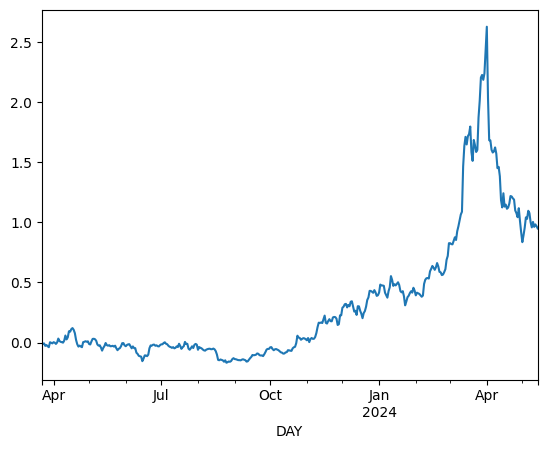

In [69]:
print("Cumulative Return:\n", cumulative_return.head())
print("Cumulative Return:\n", cumulative_return.tail())
cumulative_return.plot()

mvo_cumulative_return = cumulative_return.copy()

Normalized Returns:
             PanamaDAO_treasury_return
DAY                                  
2023-03-22                 100.000000
2023-03-23                  99.082452
2023-03-24                  99.278317
2023-03-25                  97.234602
2023-03-26                  97.996140
Normalized Returns:
             PanamaDAO_treasury_return
DAY                                  
2024-05-10                 200.371452
2024-05-11                 196.231933
2024-05-12                 198.296578
2024-05-13                 196.803004
2024-05-14                 194.924507


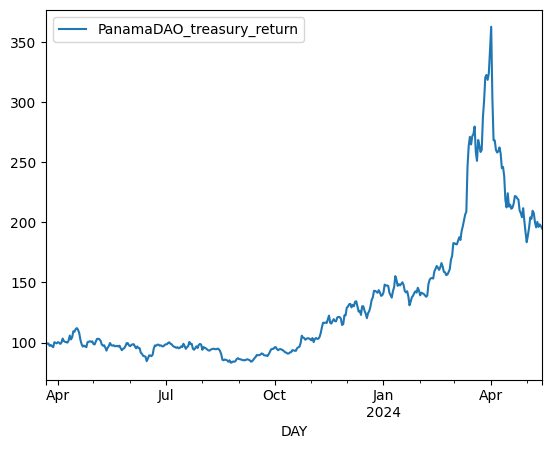

In [70]:
print("Normalized Returns:\n", normalized_returns.head())
print("Normalized Returns:\n", normalized_returns.tail())
normalized_returns.plot()

mvo_normalized_returns = normalized_returns.copy()

In [71]:
composition_columns = [f'COMPOSITION_{asset}' for asset in mvo_combined_assets]
mvo_comp = rebalanced_data[composition_columns]
mvo_comp

,COMPOSITION_COMP,COMPOSITION_CWBTC,COMPOSITION_DPI,COMPOSITION_ETH,COMPOSITION_GFI,COMPOSITION_MKR,COMPOSITION_PAXG,COMPOSITION_RETH,COMPOSITION_RPL,COMPOSITION_SOL,COMPOSITION_UNI,COMPOSITION_USDC,COMPOSITION_WBTC,COMPOSITION_WETH,COMPOSITION_WSTETH
DAY,,,,,,,,,,,,,,,
2023-01-22,0.000000e+00,0.000000e+00,0.000000e+00,NaN,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,NaN,0.000000e+00,NaN,0.000000e+00
2023-01-23,0.000000e+00,0.000000e+00,0.000000e+00,NaN,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,NaN,0.000000e+00,NaN,0.000000e+00
2023-01-24,0.000000e+00,0.000000e+00,0.000000e+00,NaN,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,NaN,0.000000e+00,NaN,0.000000e+00
2023-01-25,0.000000e+00,0.000000e+00,0.000000e+00,NaN,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,NaN,0.000000e+00,NaN,0.000000e+00
2023-01-26,0.000000e+00,0.000000e+00,0.000000e+00,NaN,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,NaN,0.000000e+00,NaN,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-10,-0.000000e+00,1.000000e-10,-0.000000e+00,0.2,0.2,0.3,-0.000000e+00,0.000000e+00,-0.000000e+00,0.3,-0.000000e+00,-0.000000e+00,0.000000e+00,-0.000000e+00,-0.000000e+00
2024-05-11,-1.000000e-10,1.000000e-10,-1.000000e-10,0.2,0.2,0.3,-1.000000e-10,-0.000000e+00,-2.000000e-10,0.3,-2.000000e-10,-1.000000e-10,0.000000e+00,-1.000000e-10,-0.000000e+00
2024-05-12,-1.000000e-10,1.000000e-10,-1.000000e-10,0.2,0.2,0.3,-1.000000e-10,0.000000e+00,-2.000000e-10,0.3,-2.000000e-10,-1.000000e-10,0.000000e+00,-1.000000e-10,-1.000000e-10


In [72]:
# Define a threshold
threshold = 1e-5

# Replace values below the threshold with 0
mvo_comp = mvo_comp.applymap(lambda x: 0 if abs(x) < threshold else x)
mvo_comp

C:\Users\brandyns pc\AppData\Local\Temp\ipykernel_21216\1323881994.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mvo_comp = mvo_comp.applymap(lambda x: 0 if abs(x) < threshold else x)


,COMPOSITION_COMP,COMPOSITION_CWBTC,COMPOSITION_DPI,COMPOSITION_ETH,COMPOSITION_GFI,COMPOSITION_MKR,COMPOSITION_PAXG,COMPOSITION_RETH,COMPOSITION_RPL,COMPOSITION_SOL,COMPOSITION_UNI,COMPOSITION_USDC,COMPOSITION_WBTC,COMPOSITION_WETH,COMPOSITION_WSTETH
DAY,,,,,,,,,,,,,,,
2023-01-22,0.0,0.0,0,NaN,0.0,0.0,0,0.0,0.0,0.0,0,NaN,0.0,NaN,0.0
2023-01-23,0.0,0.0,0,NaN,0.0,0.0,0,0.0,0.0,0.0,0,NaN,0.0,NaN,0.0
2023-01-24,0.0,0.0,0,NaN,0.0,0.0,0,0.0,0.0,0.0,0,NaN,0.0,NaN,0.0
2023-01-25,0.0,0.0,0,NaN,0.0,0.0,0,0.0,0.0,0.0,0,NaN,0.0,NaN,0.0
2023-01-26,0.0,0.0,0,NaN,0.0,0.0,0,0.0,0.0,0.0,0,NaN,0.0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-10,0.0,0.0,0,0.2,0.2,0.3,0,0.0,0.0,0.3,0,0.0,0.0,0.0,0.0
2024-05-11,0.0,0.0,0,0.2,0.2,0.3,0,0.0,0.0,0.3,0,0.0,0.0,0.0,0.0
2024-05-12,0.0,0.0,0,0.2,0.2,0.3,0,0.0,0.0,0.3,0,0.0,0.0,0.0,0.0


In [73]:
mvo_comp.tail(50)
print(mvo_comp.columns)

Index(['COMPOSITION_COMP', 'COMPOSITION_CWBTC', 'COMPOSITION_DPI',
       'COMPOSITION_ETH', 'COMPOSITION_GFI', 'COMPOSITION_MKR',
       'COMPOSITION_PAXG', 'COMPOSITION_RETH', 'COMPOSITION_RPL',
       'COMPOSITION_SOL', 'COMPOSITION_UNI', 'COMPOSITION_USDC',
       'COMPOSITION_WBTC', 'COMPOSITION_WETH', 'COMPOSITION_WSTETH'],
      dtype='object')


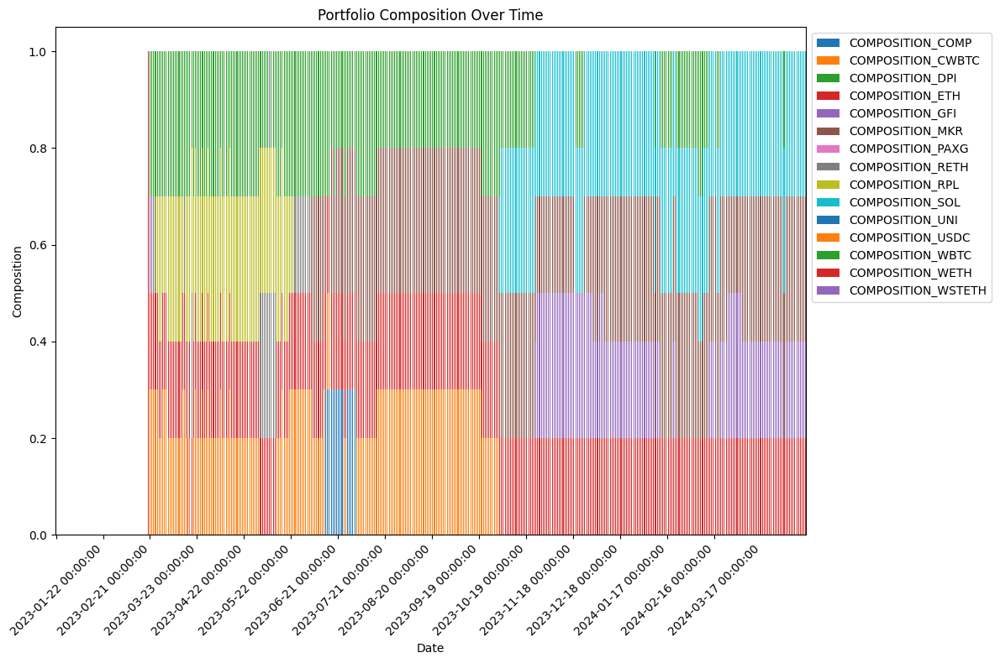

In [74]:
# Plot the latest composition as a bar chart


# Plot the stacked bar chart
# Plot the stacked bar chart
fig, ax = plt.subplots(figsize=(12, 8))

mvo_comp.plot(kind='bar', stacked=True, ax=ax)

# Improve the x-axis labels
plt.title('Portfolio Composition Over Time')
plt.xlabel('Date')
plt.ylabel('Composition')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.xticks(ticks=range(0, len(pivot_data_filtered), 30), rotation=45)  # Show x-axis labels every 30 days
plt.tight_layout()
plt.show()

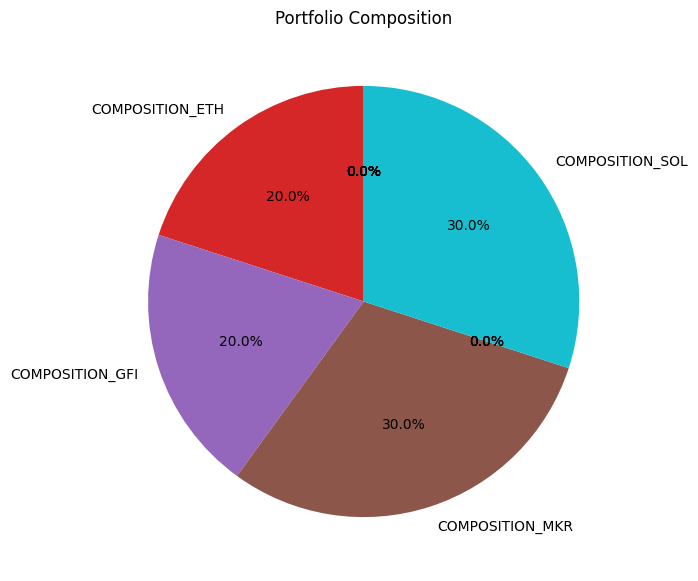

In [75]:
latest_comp_mvo = mvo_comp.iloc[-1]
# Plot the pie chart

def mvo_composition(): 
    plt.figure(figsize=(10, 7))
    latest_comp_mvo.plot.pie(autopct='%1.1f%%', startangle=90)
    plt.title('Portfolio Composition')
    plt.ylabel('')  # Hide the y-label
    return plt.show()
    
mvo_composition()

In [76]:
comp_columns = [col for col in pivot_data_filtered.columns if col.startswith('COMPOSITION_')]


latest_historical_comp = pivot_data_filtered[comp_columns].iloc[-2]

def historical_composition():
    plt.figure(figsize=(10, 7))
    latest_historical_comp.plot.pie(autopct='%1.1f%%', startangle=90)
    plt.title('Portfolio Composition')
    plt.ylabel('')  # Hide the y-label
    return plt.show()



## RL Rebalancing

In [77]:
combined_data1.isna().sum().sum()

0

## Trying all assets, historical sortinos

In [78]:
rl_combined_all_assets = combined_all_assets.fillna(0)

In [79]:
mvo_combined_assets

array(['COMP', 'CWBTC', 'DPI', 'ETH', 'GFI', 'MKR', 'PAXG', 'RETH', 'RPL',
       'SOL', 'UNI', 'USDC', 'WBTC', 'WETH', 'WSTETH'], dtype='<U6')

In [80]:
rl_combined_all_assets.iloc[0][[f'COMPOSITION_{asset}' for asset in combined_assets]]

COMPOSITION_AAVE      0.0
COMPOSITION_ARB       0.0
COMPOSITION_BAL       0.0
COMPOSITION_CDAI      0.0
COMPOSITION_CELR      0.0
COMPOSITION_CETH      0.0
COMPOSITION_COMP      0.0
COMPOSITION_CWBTC     0.0
COMPOSITION_DPI       0.0
COMPOSITION_ENS       0.0
COMPOSITION_ETH       0.0
COMPOSITION_FRAX      0.0
COMPOSITION_G         0.0
COMPOSITION_GFI       0.0
COMPOSITION_HOP       0.0
COMPOSITION_MKR       0.0
COMPOSITION_MPL       0.0
COMPOSITION_PAXG      0.0
COMPOSITION_REN       0.0
COMPOSITION_RETH      0.0
COMPOSITION_RPL       0.0
COMPOSITION_RSR       0.0
COMPOSITION_SOL       0.0
COMPOSITION_STG       0.0
COMPOSITION_UNI       0.0
COMPOSITION_USDC      0.0
COMPOSITION_WBTC      0.0
COMPOSITION_WETH      0.0
COMPOSITION_WSTETH    0.0
Name: 2023-01-22 00:00:00, dtype: float64

In [81]:
rl_combined_all_assets.iloc[0][[f'COMPOSITION_{asset}' for asset in all_assets]].values

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [82]:
prices_input = rl_combined_all_assets[[col for col in rl_combined_all_assets.columns if 'DAILY_PRICE_' in col]]
prices_input

,DAILY_PRICE_AAVE,DAILY_PRICE_ARB,DAILY_PRICE_BAL,DAILY_PRICE_CDAI,DAILY_PRICE_CELR,DAILY_PRICE_CETH,DAILY_PRICE_COMP,DAILY_PRICE_CWBTC,DAILY_PRICE_DPI,DAILY_PRICE_ENS,...,DAILY_PRICE_RPL,DAILY_PRICE_RSR,DAILY_PRICE_SOL,DAILY_PRICE_STG,DAILY_PRICE_UNI,DAILY_PRICE_USDC,DAILY_PRICE_WBTC,DAILY_PRICE_WETH,DAILY_PRICE_WSTETH,DAILY_PRICE_ETH
DAY,,,,,,,,,,,,,,,,,,,,,
2023-01-22,86.026914,0.006462,6.921808,0.024866,0.014425,77.805422,52.000952,459.213068,83.477768,14.669329,...,35.469398,0.004200,12.482600,0.620903,4.708196,1.000000,22783.328348,1632.345526,1800.156377,1632.345526
2023-01-23,86.672137,0.006462,6.940448,0.024872,0.015137,77.805422,52.350294,459.091330,84.322792,14.902668,...,35.468324,0.004323,12.217791,0.636852,4.732913,0.999869,22750.074961,1630.674473,1799.058410,1630.674473
2023-01-24,85.981641,0.006462,6.938768,0.024868,0.016605,77.805422,51.541324,462.321224,84.115264,14.871381,...,39.176504,0.004567,12.254735,0.649635,4.652931,1.000000,22932.901060,1626.390236,1796.258220,1626.390236
2023-01-25,81.389200,0.006462,6.710481,0.024862,0.015850,75.862089,49.392540,456.044609,79.606103,13.987802,...,37.175419,0.004259,11.671734,0.594947,4.413676,1.000000,22609.103191,1553.676800,1715.579150,1553.676800
2023-01-26,86.833093,0.006462,6.937327,0.024871,0.016519,77.805422,51.813935,464.157226,83.079416,15.115527,...,39.415002,0.004450,12.263251,0.641346,4.583892,0.999656,23024.863338,1609.831241,1776.394800,1609.831241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-11,83.457847,1.000032,3.422089,0.023266,0.027118,58.587875,53.966144,1222.938708,92.580027,14.012730,...,19.339806,0.006210,145.270884,0.465580,7.128672,0.999440,60892.619910,2915.597823,3398.573921,2915.597823
2024-05-12,83.008768,1.001073,3.415458,0.023276,0.026459,58.749831,54.094502,1226.698195,92.848658,13.956019,...,19.705780,0.006077,145.865957,0.470687,7.126533,0.999292,61107.113179,2923.630833,3407.611226,2923.630833
2024-05-13,83.177926,0.986348,3.412545,0.023281,0.025333,59.088438,54.958834,1249.763695,92.017490,13.786377,...,19.769431,0.005958,144.946969,0.459779,7.059514,1.000000,62181.869471,2939.990888,3426.866016,2939.990888


In [83]:
combined_assets

array(['AAVE', 'ARB', 'BAL', 'CDAI', 'CELR', 'CETH', 'COMP', 'CWBTC',
       'DPI', 'ENS', 'ETH', 'FRAX', 'G', 'GFI', 'HOP', 'MKR', 'MPL',
       'PAXG', 'REN', 'RETH', 'RPL', 'RSR', 'SOL', 'STG', 'UNI', 'USDC',
       'WBTC', 'WETH', 'WSTETH'], dtype=object)

## Data Cleaning

In [84]:
# Load the prices data
prices_input = rl_combined_all_assets[[col for col in rl_combined_all_assets.columns if 'DAILY_PRICE_' in col]]

# Calculate daily returns
returns = prices_input.pct_change()

# Describe the returns to understand the distribution
returns_description = returns.describe()
print(returns_description)

# Cap extreme values using a threshold based on standard deviation
def cap_extreme_values(series, threshold=3):
    mean = series.mean()
    std = series.std()
    upper_limit = mean + threshold * std
    lower_limit = mean - threshold * std
    return np.clip(series, lower_limit, upper_limit)

# Apply capping to all columns
capped_returns = returns.apply(cap_extreme_values, axis=0)

# Fill missing values by forward filling
cleaned_returns = capped_returns.fillna(method='ffill')

# Verify there are no NaN values left
#assert not cleaned_returns.isnull().values.any(), "There are still NaN values in the cleaned returns."

# Reconstruct the cleaned prices from the cleaned returns
cleaned_prices = (cleaned_returns + 1).cumprod() * prices_input.iloc[0]

# Verify the cleaned prices
cleaned_prices_description = cleaned_prices.describe()
print(cleaned_prices_description)

# Update the original data with cleaned prices
rl_combined_all_assets_cleaned = rl_combined_all_assets.copy()
for col in prices_input.columns:
    rl_combined_all_assets_cleaned[col] = cleaned_prices[col]

       DAILY_PRICE_AAVE  DAILY_PRICE_ARB  DAILY_PRICE_BAL  DAILY_PRICE_CDAI  \
count        479.000000       479.000000       479.000000        479.000000   
mean           0.000492         0.163718        -0.001151         -0.000129   
std            0.033976         3.529909         0.025955          0.003681   
min           -0.168086        -0.167484        -0.132124         -0.072352   
25%           -0.017685        -0.017740        -0.013822         -0.000087   
50%           -0.000075         0.000000        -0.001161          0.000055   
75%            0.016488         0.016684         0.013017          0.000215   
max            0.194784        77.250000         0.101838          0.015002   

       DAILY_PRICE_CELR  DAILY_PRICE_CETH  DAILY_PRICE_COMP  \
count        479.000000        479.000000        479.000000   
mean           0.001995          0.000576          0.000793   
std            0.040553          0.048095          0.038314   
min           -0.212967         -0.2

C:\Users\brandyns pc\AppData\Local\Temp\ipykernel_21216\1370136863.py:23: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  cleaned_returns = capped_returns.fillna(method='ffill')


## Not Fully Log Return; Log to Simple

import gym
from gym import spaces
import numpy as np
import pandas as pd
from stable_baselines3 import PPO
from scipy.optimize import minimize, Bounds, LinearConstraint

def mvo(data, annual_risk_free_rate=current_risk_free):
    try:
        portfolio = data[[f'COMPOSITION_{asset}' for asset in all_assets]]
        returns = portfolio.pct_change().fillna(0)
        total_portfolio_value = portfolio.sum(axis=1)
        composition = portfolio.divide(total_portfolio_value, axis=0)

        assert not returns.isnull().values.any(), "Returns contain NaN values"
        assert not np.isinf(returns).values.any(), "Returns contain inf values"

        daily_risk_free_rate = (1 + annual_risk_free_rate) ** (1/365) - 1
        excess_returns = returns - daily_risk_free_rate
        downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
        daily_downside_deviation = np.sqrt(downside_returns.mean())
        active_days = returns.notna().sum().max()
        annual_factor = 365 / active_days
        compounding_return = (1 + excess_returns).prod() ** annual_factor - 1
        annual_downside_deviation = daily_downside_deviation * np.sqrt(365)
        sortino_ratio = compounding_return / annual_downside_deviation

        def sortino_ratio_objective(weights):
            portfolio_returns = np.dot(returns, weights)
            excess_portfolio_returns = portfolio_returns - daily_risk_free_rate
            downside_portfolio_returns = np.where(excess_portfolio_returns < 0, excess_portfolio_returns**2, 0)
            portfolio_downside_deviation = np.sqrt(downside_portfolio_returns.mean())
            annual_portfolio_return = (1 + excess_portfolio_returns).prod() ** (365 / len(excess_portfolio_returns)) - 1
            portfolio_annual_downside_deviation = portfolio_downside_deviation * np.sqrt(365)
            return -annual_portfolio_return / portfolio_annual_downside_deviation

        num_assets = len(all_assets)
        bounds = Bounds([0.01] * num_assets, [0.5] * num_assets)
        constraints = LinearConstraint([1] * num_assets, [1], [1])
        options = {'verbose': 1, 'maxiter': 1000}

        result = minimize(sortino_ratio_objective, composition.mean().values, method='trust-constr',
                          bounds=bounds, constraints=constraints, options=options)

        if result.success:
            optimized_weights = result.x
            return optimized_weights, returns, composition, total_portfolio_value
        else:
            print("Optimization failed:", result.message)
            return None, None, None, None

    except Exception as e:
        print(f"Error during MVO computation: {e}")
        return None, None, None, None

def calculate_sortino_ratio(returns, risk_free=current_risk_free):
    returns = pd.Series(returns)
    daily_risk_free_rate = (1 + risk_free) ** (1/365) - 1

    excess_returns = returns - daily_risk_free_rate
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    daily_downside_deviation = np.sqrt(downside_returns.mean())

    if np.isnan(daily_downside_deviation):
        daily_downside_deviation = 0.0

    active_days = returns.notna().sum()
    annual_factor = 365 / active_days
    compounding_return = (1 + excess_returns).prod() ** annual_factor - 1
    annual_downside_deviation = daily_downside_deviation * np.sqrt(365)

    sortino_ratio = compounding_return / annual_downside_deviation if annual_downside_deviation != 0 else 0.0
    
    if np.isinf(sortino_ratio) or sortino_ratio > 1000:
        sortino_ratio = 0.0
        print("Unusual Sortino ratio detected, setting to 0.0")
        
    print('sortino ratio', sortino_ratio)
    return sortino_ratio

def normalize_portfolio(portfolio):
    total = np.sum(portfolio)
    if total != 0:
        return portfolio / total
    return portfolio

class PortfolioEnv(gym.Env):
    def __init__(self, data, initial_composition, rebalancing_frequency=7, start_date=None):
        super(PortfolioEnv, self).__init__()
        
        self.data = data
        self.num_assets = len(all_assets)
        self.initial_composition = initial_composition
        self.rebalancing_frequency = rebalancing_frequency
        self.start_date = start_date
        self.eth_index = np.where(all_assets == 'ETH')[0][0]

        self.observation_space = spaces.Box(
            low=0, high=np.inf, shape=(2 * self.num_assets,), dtype=np.float32
        )
        
        self.action_space = spaces.Box(low=0, high=1, shape=(self.num_assets,), dtype=np.float32)
        
        self.actions_log = []
        self.returns_log = []
        self.composition_log = []
        self.reset()
    
    def reset(self):
        if self.start_date:
            self.current_step = self.data.index.get_loc(self.start_date)
        else:
            self.current_step = 0
        self.done = False
        self.portfolio = self.initial_composition
        self.actions_log = []
        self.returns_log = []
        self.composition_log = [(self.data.index[self.current_step], self.portfolio.copy())]
        print(f"Environment reset. Initial composition: {self.portfolio}")
        return self._next_observation()
    
    def _next_observation(self):
        prices = self.data.iloc[self.current_step][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
        obs = np.concatenate([self.portfolio, prices])
        print(f'portfolio: {self.portfolio}')
        print(f'prices: {prices}')
        print(f'obs: {obs}')
        return obs

    def step(self, action):
        if self.done or self.current_step >= len(self.data) - 1:
            self.done = True
            return self._next_observation(), 0, self.done, {}

        current_prices = self.data.iloc[self.current_step][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
        prev_prices = self.data.iloc[self.current_step - 1][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values if self.current_step > 0 else current_prices

        print(f"Step {self.current_step}: Applying daily price changes")
        print(f"Previous prices: {prev_prices}")
        print(f"Current prices: {current_prices}")
        print(f"Portfolio before price change: {self.portfolio}")

        # Calculate log returns
        log_returns = np.log(current_prices / prev_prices)
        print(f"Log returns: {log_returns}")

        # Apply log returns to the portfolio
        new_portfolio_values = self.portfolio * np.exp(log_returns)
        sum_new_portfolio_values = np.sum(new_portfolio_values)
        print('new portfolio value', new_portfolio_values)
        print('sum of new port values', sum_new_portfolio_values)

        if sum_new_portfolio_values != 0:
            self.portfolio = new_portfolio_values / sum_new_portfolio_values
        else:
            self.portfolio = new_portfolio_values

        self.portfolio = normalize_portfolio(new_portfolio_values)
        print(f"Portfolio after price change: {self.portfolio}")

        if self.current_step % self.rebalancing_frequency == 0:
            action = np.clip(action, 0, 1)
            action_sum = np.sum(action)
            if action_sum == 0:
                action_sum = 1e-8

            action = action / action_sum
            print(f"Rebalancing step: {self.current_step}")
            print(f"Action taken: {action}")
            print(f"Portfolio before rebalancing: {self.portfolio}")

            self.portfolio = action
            self.actions_log.append((self.data.index[self.current_step], action))
            print(f"Portfolio after rebalancing: {self.portfolio}")

            if self.portfolio[self.eth_index] < 0.2:
                diff = 0.2 - self.portfolio[self.eth_index]
                remaining_allocation = 1 - 0.2

                self.portfolio[self.eth_index] = 0.2
                other_weights = np.delete(self.portfolio, self.eth_index)
                other_weights = other_weights / np.sum(other_weights) * remaining_allocation
                self.portfolio = np.insert(other_weights, self.eth_index, 0.2)

            print(f"Portfolio after enforcing ETH constraint: {self.portfolio}")

            self.portfolio = normalize_portfolio(self.portfolio)
            print(f"Normalized portfolio: {self.portfolio}")

        self.composition_log.append((self.data.index[self.current_step], self.portfolio.copy()))

        portfolio_return = np.sum(log_returns * self.portfolio)
        print('portfolio return', portfolio_return)

        self.returns_log.append((self.data.index[self.current_step], portfolio_return))

        if len(self.returns_log) > 2:
            sortino_ratio = calculate_sortino_ratio([r for _, r in self.returns_log])
            print('returns array', [r for _, r in self.returns_log])
        else:
            sortino_ratio = 0

        optimized_weights, _, composition, _ = mvo(self.data.iloc[:self.current_step + 1])
        print('input for mvo', self.data.iloc[:self.current_step + 1])
        if optimized_weights is not None:
            current_weights = composition.iloc[-1].values
            max_distance = sum(abs(1 - value) for value in optimized_weights)
            distance_penalty = sum(abs(current_weights[i] - optimized_weights[i]) for i in range(len(optimized_weights))) / max_distance if max_distance != 0 else 0
        else:
            distance_penalty = 0

        print(f"Step: {self.current_step}, Action: {action}, Portfolio Return: {portfolio_return}, Sortino Ratio: {sortino_ratio}, Distance Penalty: {distance_penalty}")
        # 
        reward = portfolio_return + 30 * sortino_ratio - distance_penalty 
        print('sortino ratio', sortino_ratio)
        print('reward', reward)
        obs = self._next_observation()
        self.current_step += 1
        return obs, reward, self.done, {}

def train_rl_agent(data, all_assets, rebalancing_frequency=7, start_date=None):
    initial_composition = data.loc[data.index >= start_date][[f'COMPOSITION_{asset}' for asset in all_assets]].to_numpy()[0]
    env = PortfolioEnv(data, initial_composition, rebalancing_frequency=rebalancing_frequency, start_date=start_date)
    model = PPO('MlpPolicy', env, verbose=1)
    
    total_timesteps = len(data)
    training_duration_factor = 500
    total_timesteps *= training_duration_factor

    obs = env.reset()
    for _ in range(total_timesteps):
        action, _ = model.predict(obs)
        obs, rewards, done, info = env.step(action)
        if done:
            break

    actions_log = env.actions_log
    returns_log = env.returns_log
    composition_log = env.composition_log

    actions_df = pd.DataFrame([x[1] for x in actions_log], columns=[f'WEIGHT_{asset}' for asset in all_assets])
    actions_df.index = [x[0] for x in actions_log]

    composition_df = pd.DataFrame([x[1] for x in composition_log], columns=[f'COMPOSITION_{asset}' for asset in all_assets])
    composition_df.index = [x[0] for x in composition_log]

    returns_df = pd.DataFrame([x[1] for x in returns_log], columns=['Portfolio Return'])
    returns_df.index = [x[0] for x in returns_log]

    prices_df = data.loc[data.index >= start_date, [f'DAILY_PRICE_{asset}' for asset in all_assets]]
    price_returns = prices_df.pct_change().fillna(0)
    portfolio_values = (composition_df.values * price_returns.values).sum(axis=1)
    rl_portfolio_returns = returns_df
    rl_cumulative_return = (1 + rl_portfolio_returns).cumprod() - 1

    cumulative_return_df = rl_cumulative_return.reset_index()
    cumulative_return_df.columns = ['DAY', 'cumulative_return']

    base_return = cumulative_return_df.dropna().rename(columns={'cumulative_return': 'base_cumulative_return'})

    combined = base_return[['DAY', 'base_cumulative_return']].sort_values('DAY')

    first_value = combined['base_cumulative_return'].iloc[0]
    combined['PanamaDAO_treasury_return'] = 100 + (100 * (combined['base_cumulative_return'] - first_value))

    rl_normalized_returns = combined[['DAY', 'PanamaDAO_treasury_return']]

    return actions_df, rl_portfolio_returns, rl_cumulative_return, rl_normalized_returns, composition_df, returns_df

# Usage example
rebalancing_frequency = 7

all_assets = mvo_combined_assets

start_date = panama_dao_start_date

actions_df, rl_portfolio_returns, rl_cumulative_return, rl_normalized_returns, composition_df, returns_df = train_rl_agent(rl_combined_all_assets, all_assets, rebalancing_frequency, start_date)

print(rl_normalized_returns.head())
print(returns_df.head())


## Full Log Returns

In [85]:
def calculate_log_returns(prices):
    return np.log(prices / prices.shift(1)).dropna()

def mvo(data, annual_risk_free_rate=current_risk_free):
    try:
        portfolio = data[[f'DAILY_PRICE_{asset}' for asset in all_assets]]
        returns = calculate_log_returns(portfolio)
        total_portfolio_value = portfolio.sum(axis=1)
        composition = portfolio.divide(total_portfolio_value, axis=0)

        assert not returns.isnull().values.any(), "Returns contain NaN values"
        assert not np.isinf(returns).values.any(), "Returns contain inf values"

        daily_risk_free_rate = (1 + annual_risk_free_rate) ** (1/365) - 1
        excess_returns = returns - daily_risk_free_rate
        downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
        daily_downside_deviation = np.sqrt(downside_returns.mean())
        active_days = returns.notna().sum().max()
        annual_factor = 365 / active_days
        compounding_return = (1 + excess_returns).prod() ** annual_factor - 1
        annual_downside_deviation = daily_downside_deviation * np.sqrt(365)
        sortino_ratio = compounding_return / annual_downside_deviation

        def sortino_ratio_objective(weights):
            portfolio_returns = np.dot(returns, weights)
            excess_portfolio_returns = portfolio_returns - daily_risk_free_rate
            downside_portfolio_returns = np.where(excess_portfolio_returns < 0, excess_portfolio_returns**2, 0)
            portfolio_downside_deviation = np.sqrt(downside_portfolio_returns.mean())
            annual_portfolio_return = (1 + excess_portfolio_returns).prod() ** (365 / len(excess_portfolio_returns)) - 1
            portfolio_annual_downside_deviation = portfolio_downside_deviation * np.sqrt(365)
            return -annual_portfolio_return / portfolio_annual_downside_deviation

        num_assets = len(all_assets)
        bounds = Bounds([0.01] * num_assets, [0.5] * num_assets)
        constraints = LinearConstraint([1] * num_assets, [1], [1])
        options = {'verbose': 1, 'maxiter': 1000}

        result = minimize(sortino_ratio_objective, composition.mean().values, method='trust-constr',
                          bounds=bounds, constraints=constraints, options=options)

        if result.success:
            optimized_weights = result.x
            return optimized_weights, returns, composition, total_portfolio_value
        else:
            print("Optimization failed:", result.message)
            return None, None, None, None

    except Exception as e:
        print(f"Error during MVO computation: {e}")
        return None, None, None, None

def calculate_sortino_ratio(returns, risk_free=current_risk_free):
    returns = pd.Series(returns)
    daily_risk_free_rate = (1 + risk_free) ** (1/365) - 1

    excess_returns = returns - daily_risk_free_rate
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    daily_downside_deviation = np.sqrt(downside_returns.mean())

    if np.isnan(daily_downside_deviation):
        daily_downside_deviation = 0.0

    active_days = returns.notna().sum()
    annual_factor = 365 / active_days
    compounding_return = (1 + excess_returns).prod() ** annual_factor - 1
    annual_downside_deviation = daily_downside_deviation * np.sqrt(365)

    sortino_ratio = compounding_return / annual_downside_deviation if annual_downside_deviation != 0 else 0.0
    
    if np.isinf(sortino_ratio) or sortino_ratio > 1000:
        sortino_ratio = 0.0
        print("Unusual Sortino ratio detected, setting to 0.0")
        
    print('sortino ratio', sortino_ratio)
    return sortino_ratio

def normalize_portfolio(portfolio):
    total = np.sum(portfolio)
    if total != 0:
        return portfolio / total
    return portfolio

class PortfolioEnv(gym.Env):
    def __init__(self, data, initial_composition, rebalancing_frequency=7, start_date=None):
        super(PortfolioEnv, self).__init__()

        self.data = data
        self.num_assets = len(all_assets)
        self.initial_composition = initial_composition
        self.rebalancing_frequency = rebalancing_frequency
        self.start_date = start_date
        self.eth_index = np.where(all_assets == 'ETH')[0][0]

        self.observation_space = spaces.Box(
            low=0, high=np.inf, shape=(2 * self.num_assets,), dtype=np.float32
        )

        self.action_space = spaces.Box(low=0, high=1, shape=(self.num_assets,), dtype=np.float32)

        self.actions_log = []
        self.returns_log = []
        self.composition_log = []
        self.reset()

    def reset(self):
        if self.start_date:
            self.current_step = self.data.index.get_loc(self.start_date)
        else:
            self.current_step = 0
        self.done = False
        self.portfolio = self.initial_composition
        self.actions_log = []
        self.returns_log = []
        self.composition_log = [(self.data.index[self.current_step], self.portfolio.copy())]
        print(f"Environment reset. Initial composition: {self.portfolio}")
        return self._next_observation()

    def _next_observation(self):
        prices = self.data.iloc[self.current_step][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
        obs = np.concatenate([self.portfolio, prices])
        print(f'portfolio: {self.portfolio}')
        #print(f'prices: {prices}')
        #print(f'obs: {obs}')
        return obs

    def step(self, action):
        if self.done or self.current_step >= len(self.data) - 1:
            self.done = True
            return self._next_observation(), 0, self.done, {}

        current_prices = self.data.iloc[self.current_step][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
        prev_prices = self.data.iloc[self.current_step - 1][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values if self.current_step > 0 else current_prices

        print(f"Step {self.current_step}: Applying daily price changes")
        #print(f"Previous prices: {prev_prices}")
        #print(f"Current prices: {current_prices}")
        print(f"Portfolio before price change: {self.portfolio}")

        # Calculate log returns
        log_returns = np.log(current_prices / prev_prices)
        print(f"Log returns: {log_returns}")

        # Apply log returns to the portfolio
        new_portfolio_values = self.portfolio * np.exp(log_returns)
        sum_new_portfolio_values = np.sum(new_portfolio_values)
        print('new portfolio value', new_portfolio_values)
        print('sum of new port values', sum_new_portfolio_values)

        if sum_new_portfolio_values != 0:
            self.portfolio = new_portfolio_values / sum_new_portfolio_values
        else:
            self.portfolio = new_portfolio_values

        self.portfolio = normalize_portfolio(new_portfolio_values)
        print(f"Portfolio after price change: {self.portfolio}")

        if self.current_step % self.rebalancing_frequency == 0:
            action = np.clip(action, 0, 1)
            action_sum = np.sum(action)
            if action_sum == 0:
                action_sum = 1e-8

            action = action / action_sum
            print(f"Rebalancing step: {self.current_step}")
            print(f"Action taken: {action}")
            print(f"Portfolio before rebalancing: {self.portfolio}")

            self.portfolio = action
            self.actions_log.append((self.data.index[self.current_step], action))
            print(f"Portfolio after rebalancing: {self.portfolio}")

            if self.portfolio[self.eth_index] < 0.2:
                diff = 0.2 - self.portfolio[self.eth_index]
                remaining_allocation = 1 - 0.2

                self.portfolio[self.eth_index] = 0.2
                other_weights = np.delete(self.portfolio, self.eth_index)
                other_weights = other_weights / np.sum(other_weights) * remaining_allocation
                self.portfolio = np.insert(other_weights, self.eth_index, 0.2)

            print(f"Portfolio after enforcing ETH constraint: {self.portfolio}")

            self.portfolio = normalize_portfolio(self.portfolio)
            print(f"Normalized portfolio: {self.portfolio}")

        self.composition_log.append((self.data.index[self.current_step], self.portfolio.copy()))

        portfolio_return = np.sum(log_returns * self.portfolio)
        print('portfolio return', portfolio_return)

        self.returns_log.append((self.data.index[self.current_step], portfolio_return))

        if len(self.returns_log) > 2:
            sortino_ratio = calculate_sortino_ratio([r for _, r in self.returns_log])
            print('returns array', [r for _, r in self.returns_log])
        else:
            sortino_ratio = 0

        optimized_weights, _, composition, _ = mvo(self.data.iloc[:self.current_step + 1])
        #print('input for mvo', self.data.iloc[:self.current_step + 1])
        if optimized_weights is not None:
            current_weights = composition.iloc[-1].values
            max_distance = sum(abs(1 - value) for value in optimized_weights)
            distance_penalty = sum(abs(current_weights[i] - optimized_weights[i]) for i in range(len(optimized_weights))) / max_distance if max_distance != 0 else 0
        else:
            distance_penalty = 0

        print(f"Step: {self.current_step}, Action: {action}, Portfolio Return: {portfolio_return}, Sortino Ratio: {sortino_ratio}, Distance Penalty: {distance_penalty}")
        #
        reward = portfolio_return + sortino_ratio - distance_penalty 
        print('sortino ratio', sortino_ratio)
        print('reward', reward)
        obs = self._next_observation()
        self.current_step += 1
        return obs, reward, self.done, {}

def train_rl_agent(data, all_assets, rebalancing_frequency=7, start_date=None):
    initial_composition = data.loc[data.index >= start_date][[f'COMPOSITION_{asset}' for asset in all_assets]].to_numpy()[0]
    env = PortfolioEnv(data, initial_composition, rebalancing_frequency=rebalancing_frequency, start_date=start_date)
    model = PPO('MlpPolicy', env, verbose=1)

    total_timesteps = len(data)
    training_duration_factor = 1000
    total_timesteps *= training_duration_factor

    obs = env.reset()
    for _ in range(total_timesteps):
        action, _ = model.predict(obs)
        action = np.clip(action, 0, 1)
        action_sum = np.sum(action)
        if action_sum == 0:
            action_sum = 1e-8
        action = action / action_sum

        obs, rewards, done, info = env.step(action)
        if done:
            break

    actions_log = env.actions_log
    returns_log = env.returns_log
    composition_log = env.composition_log

    actions_df = pd.DataFrame([x[1] for x in actions_log], columns=[f'WEIGHT_{asset}' for asset in all_assets])
    actions_df.index = [x[0] for x in actions_log]

    composition_df = pd.DataFrame([x[1] for x in composition_log], columns=[f'COMPOSITION_{asset}' for asset in all_assets])
    composition_df.index = [x[0] for x in composition_log]

    returns_df = pd.DataFrame([x[1] for x in returns_log], columns=['Portfolio Return'])
    returns_df.index = [x[0] for x in returns_log]

    prices_df = data.loc[data.index >= start_date, [f'DAILY_PRICE_{asset}' for asset in all_assets]]
    prices_df = prices_df.iloc[:-1]
    log_price_returns = calculate_log_returns(prices_df)
    # log_price_returns = log_price_returns.loc[composition_df.index]
    print('prices df index', prices_df.index.min(), prices_df.index.max())
    print('composition df index', composition_df.index.min(), composition_df.index.max())
    composition_df = composition_df.loc[log_price_returns.index]
    portfolio_values = (composition_df.values * log_price_returns.values).sum(axis=1)
    rl_portfolio_returns = returns_df
    rl_cumulative_return = (1 + rl_portfolio_returns).cumprod() - 1

    cumulative_return_df = rl_cumulative_return.reset_index()
    cumulative_return_df.columns = ['DAY', 'cumulative_return']

    base_return = cumulative_return_df.dropna().rename(columns={'cumulative_return': 'base_cumulative_return'})

    combined = base_return[['DAY', 'base_cumulative_return']].sort_values('DAY')

    first_value = combined['base_cumulative_return'].iloc[0]
    combined['PanamaDAO_treasury_return'] = 100 + (100 * (combined['base_cumulative_return'] - first_value))

    rl_normalized_returns = combined[['DAY', 'PanamaDAO_treasury_return']]

    return actions_df, rl_portfolio_returns, rl_cumulative_return, rl_normalized_returns, composition_df, returns_df

# TRY 3, 7
rebalancing_frequency = 7

all_assets = mvo_combined_assets

start_date = panama_dao_start_date

actions_df, rl_portfolio_returns, rl_cumulative_return, rl_normalized_returns, composition_df, returns_df = train_rl_agent(rl_combined_all_assets, all_assets, rebalancing_frequency, start_date)

print(rl_normalized_returns.head())
print(returns_df.head())

Environment reset. Initial composition: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
portfolio: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Environment reset. Initial composition: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
portfolio: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Step 59: Applying daily price changes
Portfolio before price change: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Log returns: [-0.00098936  0.00426     0.00371204  0.00745901  0.00831451  0.0036162
 -0.01139252 -0.03820969 -0.01815317 -0.009502    0.00119105  0.
  0.00319237  0.00745901  0.0080248 ]
new portfolio value [0.        0.        0.        1.0074869 0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.       ]
sum of new port values 1.0074868967597046
Portfolio after price change: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
portfolio return 0.00745900905656

C:\Users\brandyns pc\Projects\robo_advisors\robo_advisor\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


`gtol` termination condition is satisfied.
Number of iterations: 80, function evaluations: 1376, CG iterations: 200, optimality: 8.74e-09, constraint violation: 2.22e-16, execution time: 0.41 s.
Step: 65, Action: [0.21066843 0.00542758 0.         0.         0.         0.19910525
 0.10232892 0.         0.2558729  0.         0.22073914 0.
 0.00585777 0.         0.        ], Portfolio Return: -0.009011394310142602, Sortino Ratio: -4.315089606177769, Distance Penalty: 0.060130336485905676
sortino ratio -4.315089606177769
reward -4.3842313369738175
portfolio: [0.         0.         0.21582801 0.20053571 0.22419034 0.
 0.         0.         0.         0.14057284 0.18234841 0.03652469
 0.         0.         0.        ]
Step 66: Applying daily price changes
Portfolio before price change: [0.         0.         0.21582801 0.20053571 0.22419034 0.
 0.         0.         0.         0.14057284 0.18234841 0.03652469
 0.         0.         0.        ]
Log returns: [0.04573335 0.03404346 0.03769523 0

C:\Users\brandyns pc\Projects\robo_advisors\robo_advisor\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


`gtol` termination condition is satisfied.
Number of iterations: 63, function evaluations: 944, CG iterations: 131, optimality: 4.75e-09, constraint violation: 0.00e+00, execution time: 0.32 s.
Step: 88, Action: [0.05749837 0.         0.         0.00512339 0.         0.
 0.27826115 0.10259475 0.27826115 0.         0.         0.
 0.         0.         0.27826115], Portfolio Return: -0.037962572418601195, Sortino Ratio: 0.21596324275185735, Distance Penalty: 0.10392255950702411
sortino ratio 0.21596324275185735
reward 0.07407811082623206
portfolio: [0.         0.08881101 0.         0.19814651 0.         0.
 0.         0.12246184 0.11835473 0.         0.12438905 0.13234553
 0.09891466 0.         0.11657667]
Step 89: Applying daily price changes
Portfolio before price change: [0.         0.08881101 0.         0.19814651 0.         0.
 0.         0.12246184 0.11835473 0.         0.12438905 0.13234553
 0.09891466 0.         0.11657667]
Log returns: [-0.02660863 -0.02679919 -0.03617995 -0.019

C:\Users\brandyns pc\Projects\robo_advisors\robo_advisor\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


`gtol` termination condition is satisfied.
Number of iterations: 82, function evaluations: 1392, CG iterations: 261, optimality: 2.97e-09, constraint violation: 2.22e-16, execution time: 0.43 s.
Step: 139, Action: [0.0288354  0.         0.         0.19700506 0.20617583 0.16009939
 0.16947879 0.         0.09773307 0.         0.         0.
 0.         0.14067249 0.        ], Portfolio Return: -0.04127939977350977, Sortino Ratio: -2.238300379912514, Distance Penalty: 0.08580769699760164
sortino ratio -2.238300379912514
reward -2.3653874766836256
portfolio: [0.         0.11179228 0.         0.20270067 0.         0.
 0.04926197 0.         0.01456007 0.         0.17445603 0.
 0.19393211 0.15557977 0.09771711]
Step 140: Applying daily price changes
Portfolio before price change: [0.         0.11179228 0.         0.20270067 0.         0.
 0.04926197 0.         0.01456007 0.         0.17445603 0.
 0.19393211 0.15557977 0.09771711]
Log returns: [-5.26477507e-02 -1.71904270e-03 -1.99840256e-02 -8

C:\Users\brandyns pc\Projects\robo_advisors\robo_advisor\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


`xtol` termination condition is satisfied.
Number of iterations: 97, function evaluations: 912, CG iterations: 214, optimality: 3.44e-08, constraint violation: 0.00e+00, execution time: 0.34 s.
Step: 297, Action: [0.         0.         0.         0.3759254  0.14319746 0.30847865
 0.         0.         0.         0.         0.         0.
 0.17239854 0.         0.        ], Portfolio Return: 0.03084645355279304, Sortino Ratio: 2.4143851120527726, Distance Penalty: 0.09712514620107514
sortino ratio 2.4143851120527726
reward 2.3481064194044907
portfolio: [0.         0.         0.26132577 0.19144872 0.         0.17698273
 0.         0.         0.03798711 0.26687702 0.         0.
 0.         0.         0.06537864]
Step 298: Applying daily price changes
Portfolio before price change: [0.         0.         0.26132577 0.19144872 0.         0.17698273
 0.         0.         0.03798711 0.26687702 0.         0.
 0.         0.         0.06537864]
Log returns: [ 0.00288306  0.01603008  0.03882982  

C:\Users\brandyns pc\Projects\robo_advisors\robo_advisor\Lib\site-packages\scipy\optimize\_differentiable_functions.py:231: UserWarning: delta_grad == 0.0. Check if the approximated function is linear. If the function is linear better results can be obtained by defining the Hessian as zero instead of using quasi-Newton approximations.
  self.H.update(self.x - self.x_prev, self.g - self.g_prev)


`xtol` termination condition is satisfied.
Number of iterations: 90, function evaluations: 1888, CG iterations: 208, optimality: 1.61e-08, constraint violation: 0.00e+00, execution time: 0.55 s.
Step: 389, Action: [0.15843992 0.14941391 0.15843992 0.15843992 0.04953548 0.
 0.00657341 0.         0.05839345 0.07043003 0.02183553 0.01005851
 0.         0.15843992 0.        ], Portfolio Return: 0.02919980969342499, Sortino Ratio: 4.020826600279878, Distance Penalty: 0.09898531655740962
sortino ratio 4.020826600279878
reward 3.9510410934158937
portfolio: [0.         0.         0.1647034  0.20694998 0.         0.
 0.08176708 0.1086116  0.         0.08640033 0.         0.04575041
 0.02094794 0.28486926 0.        ]
Step 390: Applying daily price changes
Portfolio before price change: [0.         0.         0.1647034  0.20694998 0.         0.
 0.08176708 0.1086116  0.         0.08640033 0.         0.04575041
 0.02094794 0.28486926 0.        ]
Log returns: [ 0.01155721 -0.00085043  0.01650694  0

### Test log returns

import gym
from gym import spaces
import numpy as np
import pandas as pd
from stable_baselines3 import PPO
from scipy.optimize import minimize, Bounds, LinearConstraint
import cvxpy as cp

# Function to calculate log returns
def calculate_log_returns(prices):
    return np.log(prices / prices.shift(1)).dropna()

def mvo(data, annual_risk_free_rate=current_risk_free):
    try:
        portfolio = data[[f'DAILY_PRICE_{asset}' for asset in all_assets]]
        returns = calculate_log_returns(portfolio)
        
        # Check if returns are empty
        if returns.empty:
            raise ValueError("Returns data is empty, cannot perform MVO computation.")
        
        total_portfolio_value = portfolio.sum(axis=1)
        composition = portfolio.divide(total_portfolio_value, axis=0)

        assert not returns.isnull().values.any(), "Returns contain NaN values"
        assert not np.isinf(returns).values.any(), "Returns contain inf values"

        daily_risk_free_rate = (1 + annual_risk_free_rate) ** (1/365) - 1
        excess_returns = returns - daily_risk_free_rate
        downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
        daily_downside_deviation = np.sqrt(downside_returns.mean())

        if np.isnan(daily_downside_deviation) or daily_downside_deviation == 0:
            daily_downside_deviation = 1e-8  # Small positive number to avoid division by zero

        active_days = returns.notna().sum().max()
        annual_factor = 365 / active_days
        compounding_return = (1 + excess_returns).prod() ** annual_factor - 1
        annual_downside_deviation = daily_downside_deviation * np.sqrt(365)
        sortino_ratio = compounding_return / annual_downside_deviation if annual_downside_deviation != 0 else 0.0

        def sortino_ratio_objective(weights):
            portfolio_returns = np.dot(returns, weights)
            excess_portfolio_returns = portfolio_returns - daily_risk_free_rate
            downside_portfolio_returns = np.where(excess_portfolio_returns < 0, excess_portfolio_returns**2, 0)
            portfolio_downside_deviation = np.sqrt(downside_portfolio_returns.mean())
            if np.isnan(portfolio_downside_deviation) or portfolio_downside_deviation == 0:
                portfolio_downside_deviation = 1e-8
            annual_portfolio_return = (1 + excess_portfolio_returns).prod() ** (365 / len(excess_portfolio_returns)) - 1
            portfolio_annual_downside_deviation = portfolio_downside_deviation * np.sqrt(365)
            return -annual_portfolio_return / portfolio_annual_downside_deviation if portfolio_annual_downside_deviation != 0 else 0.0

        num_assets = len(all_assets)
        bounds = Bounds([0.01] * num_assets, [0.5] * num_assets)
        constraints = LinearConstraint([1] * num_assets, [1], [1])
        options = {'verbose': 1, 'maxiter': 1000}

        result = minimize(sortino_ratio_objective, composition.mean().values, method='trust-constr',
                          bounds=bounds, constraints=constraints, options=options)

        if result.success:
            optimized_weights = result.x
            return optimized_weights, returns, composition, total_portfolio_value
        else:
            print("Optimization failed:", result.message)
            return None, None, None, None

    except Exception as e:
        print(f"Error during MVO computation: {e}")
        print(f"Returns data causing the error:\n{returns}")
        return None, None, None, None


def calculate_sortino_ratio(returns, risk_free=current_risk_free):
    returns = pd.Series(returns)
    daily_risk_free_rate = (1 + risk_free) ** (1/365) - 1

    excess_returns = returns - daily_risk_free_rate
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    daily_downside_deviation = np.sqrt(downside_returns.mean())

    if np.isnan(daily_downside_deviation) or daily_downside_deviation == 0:
        daily_downside_deviation = 1e-8  # Small positive number to avoid division by zero

    active_days = returns.notna().sum()
    annual_factor = 365 / active_days
    compounding_return = (1 + excess_returns).prod() ** annual_factor - 1
    annual_downside_deviation = daily_downside_deviation * np.sqrt(365)

    sortino_ratio = compounding_return / annual_downside_deviation if annual_downside_deviation != 0 else 0.0
    
    if np.isinf(sortino_ratio) or sortino_ratio > 1000:
        sortino_ratio = 0.0
        print("Unusual Sortino ratio detected, setting to 0.0")
        
    print('sortino ratio', sortino_ratio)
    return sortino_ratio

def normalize_portfolio(portfolio):
    total = np.sum(portfolio)
    if total != 0:
        return portfolio / total
    return portfolio

class PortfolioEnv(gym.Env):
    def __init__(self, data, initial_composition, rebalancing_frequency=7, start_date=None):
        super(PortfolioEnv, self).__init__()
        
        self.data = data
        self.num_assets = len(all_assets)
        self.initial_composition = initial_composition
        self.rebalancing_frequency = rebalancing_frequency
        self.start_date = start_date
        self.eth_index = np.where(all_assets == 'ETH')[0][0]

        self.observation_space = spaces.Box(
            low=0, high=np.inf, shape=(2 * self.num_assets,), dtype=np.float32
        )
        
        self.action_space = spaces.Box(low=0, high=1, shape=(self.num_assets,), dtype=np.float32)
        
        self.actions_log = []
        self.returns_log = []
        self.composition_log = []
        self.reset()
    
    def reset(self):
        if self.start_date:
            self.current_step = self.data.index.get_loc(self.start_date)
        else:
            self.current_step = 0
        self.done = False
        self.portfolio = self.initial_composition
        self.actions_log = []
        self.returns_log = []
        self.composition_log = [(self.data.index[self.current_step], self.portfolio.copy())]
        print(f"Environment reset. Initial composition: {self.portfolio}")
        return self._next_observation()
    
    def _next_observation(self):
        prices = self.data.iloc[self.current_step][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
        obs = np.concatenate([self.portfolio, prices])
        print(f'portfolio: {self.portfolio}')
        print(f'prices: {prices}')
        print(f'obs: {obs}')
        return obs

    def step(self, action):
        if self.done or self.current_step >= len(self.data) - 1:
            self.done = True
            return self._next_observation(), 0, self.done, {}

        current_prices = self.data.iloc[self.current_step][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values
        prev_prices = self.data.iloc[self.current_step - 1][[f'DAILY_PRICE_{asset}' for asset in all_assets]].values if self.current_step > 0 else current_prices

        print(f"Step {self.current_step}: Applying daily price changes")
        print(f"Previous prices: {prev_prices}")
        print(f"Current prices: {current_prices}")
        print(f"Portfolio before price change: {self.portfolio}")

        # Calculate log returns
        log_returns = np.log(current_prices / prev_prices)
        print(f"Log returns: {log_returns}")

        # Apply log returns to the portfolio
        new_portfolio_values = self.portfolio * np.exp(log_returns)
        sum_new_portfolio_values = np.sum(new_portfolio_values)
        print('new portfolio value', new_portfolio_values)
        print('sum of new port values', sum_new_portfolio_values)

        if sum_new_portfolio_values != 0:
            self.portfolio = new_portfolio_values / sum_new_portfolio_values
        else:
            self.portfolio = new_portfolio_values

        self.portfolio = normalize_portfolio(new_portfolio_values)
        print(f"Portfolio after price change: {self.portfolio}")

        if self.current_step % self.rebalancing_frequency == 0:
            action = np.clip(action, 0, 1)
            action_sum = np.sum(action)
            if action_sum == 0:
                action_sum = 1e-8

            action = action / action_sum
            print(f"Rebalancing step: {self.current_step}")
            print(f"Action taken: {action}")
            print(f"Portfolio before rebalancing: {self.portfolio}")

            self.portfolio = action
            self.actions_log.append((self.data.index[self.current_step], action))
            print(f"Portfolio after rebalancing: {self.portfolio}")

            if self.portfolio[self.eth_index] < 0.2:
                diff = 0.2 - self.portfolio[self.eth_index]
                remaining_allocation = 1 - 0.2

                self.portfolio[self.eth_index] = 0.2
                other_weights = np.delete(self.portfolio, self.eth_index)
                other_weights = other_weights / np.sum(other_weights) * remaining_allocation
                self.portfolio = np.insert(other_weights, self.eth_index, 0.2)

            print(f"Portfolio after enforcing ETH constraint: {self.portfolio}")

            self.portfolio = normalize_portfolio(self.portfolio)
            print(f"Normalized portfolio: {self.portfolio}")

        self.composition_log.append((self.data.index[self.current_step], self.portfolio.copy()))

        portfolio_return = np.sum(log_returns * self.portfolio)
        print('portfolio return', portfolio_return)

        self.returns_log.append((self.data.index[self.current_step], portfolio_return))

        if len(self.returns_log) > 2:
            sortino_ratio = calculate_sortino_ratio([r for _, r in self.returns_log])
            print('returns array', [r for _, r in self.returns_log])
        else:
            sortino_ratio = 0

        optimized_weights, _, composition, _ = mvo(self.data.iloc[:self.current_step + 1])
        print('input for mvo', self.data.iloc[:self.current_step + 1])
        if optimized_weights is not None:
            current_weights = composition.iloc[-1].values
            max_distance = sum(abs(1 - value) for value in optimized_weights)
            distance_penalty = sum(abs(current_weights[i] - optimized_weights[i]) for i in range(len(optimized_weights))) / max_distance if max_distance != 0 else 0
        else:
            distance_penalty = 0

        print(f"Step: {self.current_step}, Action: {action}, Portfolio Return: {portfolio_return}, Sortino Ratio: {sortino_ratio}, Distance Penalty: {distance_penalty}")
        reward = portfolio_return * sortino_ratio - distance_penalty 
        print('sortino ratio', sortino_ratio)
        print('reward', reward)
        obs = self._next_observation()
        self.current_step += 1
        return obs, reward, self.done, {}

def train_rl_agent(data, all_assets, rebalancing_frequency=7, start_date=None):
    initial_composition = data.loc[data.index >= start_date][[f'COMPOSITION_{asset}' for asset in all_assets]].to_numpy()[0]
    env = PortfolioEnv(data, initial_composition, rebalancing_frequency=rebalancing_frequency, start_date=start_date)
    model = PPO('MlpPolicy', env, verbose=1)
    
    total_timesteps = len(data)
    training_duration_factor = 1000
    total_timesteps *= training_duration_factor

    obs = env.reset()
    for _ in range(total_timesteps):
        action, _ = model.predict(obs)
        obs, rewards, done, info = env.step(action)
        if done:
            break

    actions_log = env.actions_log
    returns_log = env.returns_log
    composition_log = env.composition_log

    actions_df = pd.DataFrame([x[1] for x in actions_log], columns=[f'WEIGHT_{asset}' for asset in all_assets])
    actions_df.index = [x[0] for x in actions_log]

    composition_df = pd.DataFrame([x[1] for x in composition_log], columns=[f'COMPOSITION_{asset}' for asset in all_assets])
    composition_df.index = [x[0] for x in composition_log]

    returns_df = pd.DataFrame([x[1] for x in returns_log], columns=['Portfolio Return'])
    returns_df.index = [x[0] for x in returns_log]

    prices_df = data.loc[data.index >= start_date, [f'DAILY_PRICE_{asset}' for asset in all_assets]]
    prices_df = prices_df.iloc[:-1]
    log_price_returns = calculate_log_returns(prices_df)
    composition_df = composition_df.loc[log_price_returns.index]
    portfolio_values = (composition_df.values * log_price_returns.values).sum(axis=1)
    rl_portfolio_returns = returns_df
    rl_cumulative_return = (1 + rl_portfolio_returns).cumprod() - 1

    cumulative_return_df = rl_cumulative_return.reset_index()
    cumulative_return_df.columns = ['DAY', 'cumulative_return']

    base_return = cumulative_return_df.dropna().rename(columns={'cumulative_return': 'base_cumulative_return'})

    combined = base_return[['DAY', 'base_cumulative_return']].sort_values('DAY')

    first_value = combined['base_cumulative_return'].iloc[0]
    combined['PanamaDAO_treasury_return'] = 100 + (100 * (combined['base_cumulative_return'] - first_value))

    rl_normalized_returns = combined[['DAY', 'PanamaDAO_treasury_return']]

    return actions_df, rl_portfolio_returns, rl_cumulative_return, rl_normalized_returns, composition_df, returns_df

# Usage example
rebalancing_frequency = 5

all_assets = mvo_combined_assets

start_date = panama_dao_start_date

actions_df, rl_portfolio_returns, rl_cumulative_return, rl_normalized_returns, composition_df, returns_df = train_rl_agent(rl_combined_all_assets, all_assets, rebalancing_frequency, start_date)

print(rl_normalized_returns.head())
print(returns_df.head())


In [86]:
composition_df.describe()

,COMPOSITION_COMP,COMPOSITION_CWBTC,COMPOSITION_DPI,COMPOSITION_ETH,COMPOSITION_GFI,COMPOSITION_MKR,COMPOSITION_PAXG,COMPOSITION_RETH,COMPOSITION_RPL,COMPOSITION_SOL,COMPOSITION_UNI,COMPOSITION_USDC,COMPOSITION_WBTC,COMPOSITION_WETH,COMPOSITION_WSTETH
count,419.000000,419.000000,419.000000,419.000000,419.000000,419.000000,419.000000,419.000000,419.000000,419.000000,419.000000,419.000000,419.000000,419.000000,419.000000
mean,0.046393,0.049663,0.054508,0.206870,0.058147,0.057225,0.051930,0.064622,0.053665,0.049529,0.081393,0.061836,0.048378,0.050652,0.065189
std,0.061964,0.065814,0.072958,0.067860,0.081720,0.069483,0.068930,0.082039,0.078182,0.072296,0.081589,0.075586,0.061806,0.085082,0.089249
min,0.000000,0.000000,0.000000,0.167798,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.198970,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.002145,0.032446,0.200126,0.000000,0.026878,0.002132,0.003158,0.007307,0.005164,0.069079,0.016383,0.017400,0.000000,0.019782
75%,0.090738,0.097124,0.078979,0.202931,0.121335,0.116369,0.092733,0.123183,0.093543,0.082694,0.136908,0.123492,0.096990,0.073334,0.110338
max,0.215935,0.225104,0.307078,1.000000,0.342344,0.224300,0.236955,0.317646,0.293625,0.343688,0.271269,0.281999,0.255300,0.507211,0.403447


In [87]:
returns_df

,Portfolio Return
2023-03-22,0.007459
2023-03-23,-0.009175
2023-03-24,0.007941
2023-03-25,-0.020675
2023-03-26,-0.000480
...,...
2024-05-10,0.003808
2024-05-11,-0.021411
2024-05-12,0.002970
2024-05-13,0.002637


In [88]:
actions_df

,WEIGHT_COMP,WEIGHT_CWBTC,WEIGHT_DPI,WEIGHT_ETH,WEIGHT_GFI,WEIGHT_MKR,WEIGHT_PAXG,WEIGHT_RETH,WEIGHT_RPL,WEIGHT_SOL,WEIGHT_UNI,WEIGHT_USDC,WEIGHT_WBTC,WEIGHT_WETH,WEIGHT_WSTETH
2023-03-26,0.000000,0.000000,0.256342,0.200000,0.264609,0.000000,0.000000,0.000000,0.000000,0.170070,0.213518,0.042308,0.000000,0.000000,0.000000
2023-04-02,0.000000,0.000000,0.214006,0.214006,0.157593,0.000000,0.000000,0.136645,0.000000,0.063745,0.214006,0.000000,0.000000,0.000000,0.000000
2023-04-09,0.000000,0.001391,0.094737,0.200000,0.337070,0.000000,0.147382,0.031145,0.000000,0.000000,0.035776,0.352499,0.000000,0.000000,0.000000
2023-04-16,0.000000,0.101198,0.000000,0.200000,0.000000,0.000000,0.000000,0.143007,0.143007,0.000000,0.143007,0.143007,0.113052,0.000000,0.135512
2023-04-23,0.000000,0.002566,0.153675,0.200000,0.156536,0.164146,0.000000,0.000000,0.164146,0.142109,0.000000,0.000000,0.037317,0.000000,0.164146
2023-04-30,0.069132,0.000000,0.000000,0.200000,0.023551,0.000000,0.233954,0.140616,0.000000,0.000000,0.156913,0.049202,0.021974,0.000000,0.304658
2023-05-07,0.094735,0.000000,0.000000,0.200000,0.187134,0.187134,0.061230,0.187134,0.034981,0.056081,0.006885,0.034345,0.146735,0.000000,0.000000
2023-05-14,0.112059,0.109546,0.070363,0.200000,0.112059,0.047060,0.011212,0.000000,0.014149,0.000000,0.112059,0.073826,0.040312,0.073235,0.112059
2023-05-21,0.267571,0.267571,0.229331,0.200000,0.000000,0.000000,0.000000,0.000000,0.044124,0.000000,0.133869,0.000000,0.015201,0.038770,0.003564
2023-05-28,0.000000,0.000000,0.000000,0.200000,0.000000,0.274165,0.000000,0.004412,0.277968,0.000000,0.277968,0.000000,0.000000,0.000000,0.165487


In [89]:
rl_portfolio_returns

,Portfolio Return
2023-03-22,0.007459
2023-03-23,-0.009175
2023-03-24,0.007941
2023-03-25,-0.020675
2023-03-26,-0.000480
...,...
2024-05-10,0.003808
2024-05-11,-0.021411
2024-05-12,0.002970
2024-05-13,0.002637


In [90]:
actions_df['WEIGHT_ETH']

2023-03-26    0.200000
2023-04-02    0.214006
2023-04-09    0.200000
2023-04-16    0.200000
2023-04-23    0.200000
2023-04-30    0.200000
2023-05-07    0.200000
2023-05-14    0.200000
2023-05-21    0.200000
2023-05-28    0.200000
2023-06-04    0.200000
2023-06-11    0.212374
2023-06-18    0.200000
2023-06-25    0.200000
2023-07-02    0.200000
2023-07-09    0.200000
2023-07-16    0.200000
2023-07-23    0.200000
2023-07-30    0.200000
2023-08-06    0.200000
2023-08-13    0.200000
2023-08-20    0.200000
2023-08-27    0.200000
2023-09-03    0.200000
2023-09-10    0.200000
2023-09-17    0.200000
2023-09-24    0.200000
2023-10-01    0.200000
2023-10-08    0.200000
2023-10-15    0.200000
2023-10-22    0.200000
2023-10-29    0.200000
2023-11-05    0.200000
2023-11-12    0.200000
2023-11-19    0.200000
2023-11-26    0.200000
2023-12-03    0.200000
2023-12-10    0.210321
2023-12-17    0.200000
2023-12-24    0.210356
2023-12-31    0.200000
2024-01-07    0.200000
2024-01-14    0.200000
2024-01-21 

In [91]:
composition_df['COMPOSITION_WETH']

DAY
2023-03-23    0.000000
2023-03-24    0.000000
2023-03-25    0.000000
2023-03-26    0.000000
2023-03-27    0.000000
                ...   
2024-05-10    0.072966
2024-05-11    0.072659
2024-05-12    0.112308
2024-05-13    0.112644
2024-05-14    0.112335
Name: COMPOSITION_WETH, Length: 419, dtype: float64

In [92]:
rl_cumulative_return

,Portfolio Return
2023-03-22,0.007459
2023-03-23,-0.001785
2023-03-24,0.006142
2023-03-25,-0.014660
2023-03-26,-0.015133
...,...
2024-05-10,1.105343
2024-05-11,1.060266
2024-05-12,1.066386
2024-05-13,1.071835


In [93]:
rl_normalized_returns.set_index('DAY', inplace=True)
rl_normalized_returns

,PanamaDAO_treasury_return
DAY,
2023-03-22,100.000000
2023-03-23,99.075608
2023-03-24,99.868317
2023-03-25,97.788103
2023-03-26,97.740842
...,...
2024-05-10,209.788380
2024-05-11,205.280722
2024-05-12,205.892684


In [94]:
# Find the index of the highest value in the Series
max_index = rl_portfolio_returns.idxmax()

print("Index of the highest value:", max_index)
print("Highest value:", rl_portfolio_returns.loc[max_index])


Index of the highest value: Portfolio Return   2024-03-12
dtype: datetime64[ns]
Highest value:             Portfolio Return
2024-03-12          0.136052


In [95]:
composition_df

,COMPOSITION_COMP,COMPOSITION_CWBTC,COMPOSITION_DPI,COMPOSITION_ETH,COMPOSITION_GFI,COMPOSITION_MKR,COMPOSITION_PAXG,COMPOSITION_RETH,COMPOSITION_RPL,COMPOSITION_SOL,COMPOSITION_UNI,COMPOSITION_USDC,COMPOSITION_WBTC,COMPOSITION_WETH,COMPOSITION_WSTETH
DAY,,,,,,,,,,,,,,,
2023-03-23,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2023-03-24,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2023-03-25,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2023-03-26,0.000000,0.000000,0.216586,0.200000,0.223570,0.000000,0.000000,0.000000,0.000000,0.143694,0.180403,0.035747,0.000000,0.000000,0.000000
2023-03-27,0.000000,0.000000,0.215499,0.200277,0.224253,0.000000,0.000000,0.000000,0.000000,0.141867,0.181907,0.036197,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-10,0.094854,0.000000,0.000000,0.196372,0.000000,0.177276,0.195127,0.016649,0.000000,0.000000,0.187626,0.000000,0.059129,0.072966,0.000000
2024-05-11,0.091697,0.000000,0.000000,0.195544,0.000000,0.180311,0.199089,0.016818,0.000000,0.000000,0.184742,0.000000,0.059142,0.072659,0.000000
2024-05-12,0.000000,0.112308,0.013455,0.200000,0.023383,0.106398,0.014788,0.112308,0.074095,0.096732,0.000000,0.112308,0.000000,0.112308,0.021913


In [96]:
max_index

Portfolio Return   2024-03-12
dtype: datetime64[ns]

In [97]:
composition_df.index

DatetimeIndex(['2023-03-23', '2023-03-24', '2023-03-25', '2023-03-26',
               '2023-03-27', '2023-03-28', '2023-03-29', '2023-03-30',
               '2023-03-31', '2023-04-01',
               ...
               '2024-05-05', '2024-05-06', '2024-05-07', '2024-05-08',
               '2024-05-09', '2024-05-10', '2024-05-11', '2024-05-12',
               '2024-05-13', '2024-05-14'],
              dtype='datetime64[ns]', name='DAY', length=419, freq=None)

## Highest Return Portfolio

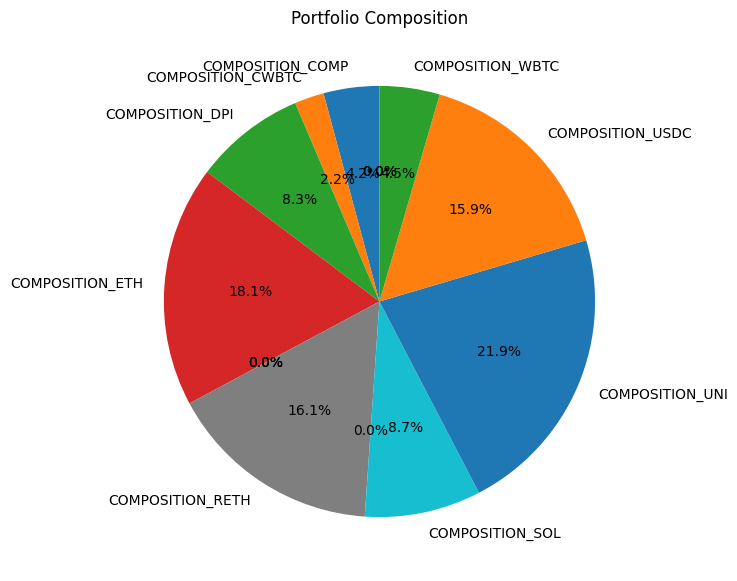

In [98]:
composition_df.loc[max_index].sum()
highest_comp_mvo = composition_df.loc[max_index].iloc[0]
# Plot the pie chart


plt.figure(figsize=(10, 7))
highest_comp_mvo.plot.pie(autopct='%1.1f%%', startangle=90)
plt.title('Portfolio Composition')
plt.ylabel('')  # Hide the y-label
plt.show()



<Axes: xlabel='DAY'>

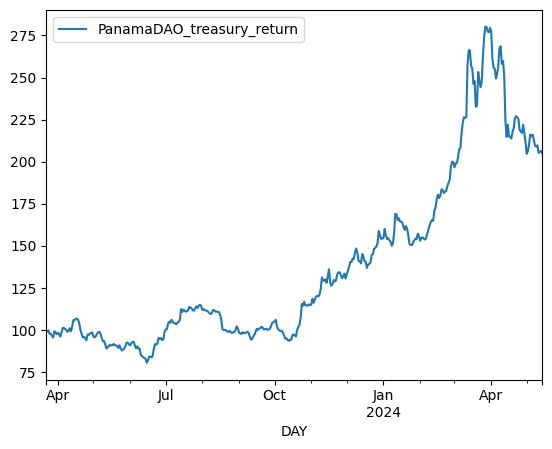

In [99]:
rl_normalized_returns.plot()

In [100]:
latest_comp_rl = composition_df.iloc[-1]
# Plot the pie chart
def rl_composition():
    plt.figure(figsize=(10, 7))
    latest_comp_rl.plot.pie(autopct='%1.1f%%', startangle=90)
    plt.title('Portfolio Composition')
    plt.ylabel('')  # Hide the y-label
    plt.show()

In [101]:
rl_portfolio_returns.max()

Portfolio Return    0.136052
dtype: float64

In [102]:
rl_portfolio_returns[rl_portfolio_returns.index >= panama_dao_start_date]

,Portfolio Return
2023-03-22,0.007459
2023-03-23,-0.009175
2023-03-24,0.007941
2023-03-25,-0.020675
2023-03-26,-0.000480
...,...
2024-05-10,0.003808
2024-05-11,-0.021411
2024-05-12,0.002970
2024-05-13,0.002637


In [103]:
sortino(rl_portfolio_returns.values)

Sortino Ratio: 2.031706079026015


2.031706079026015

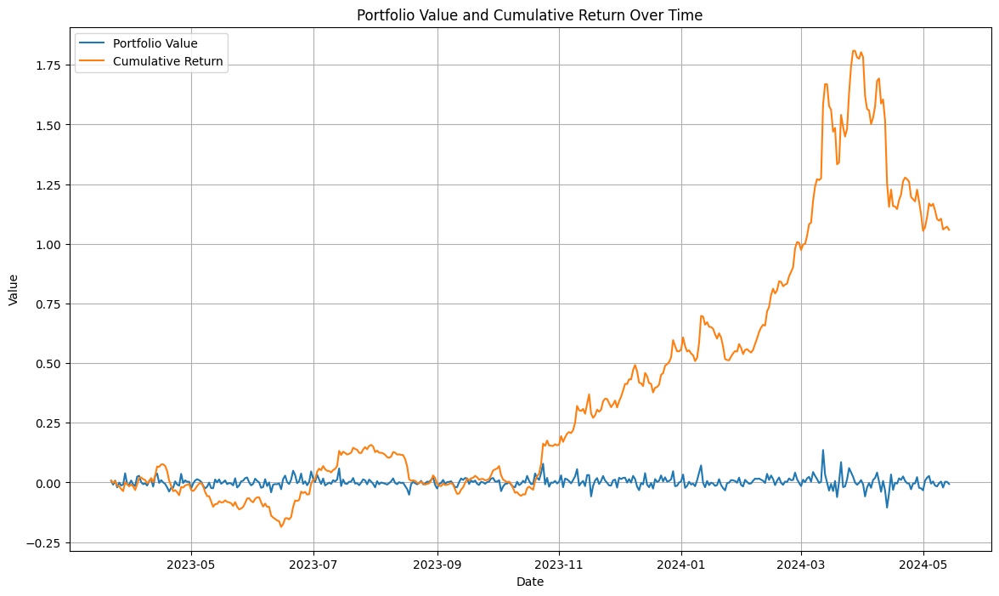

In [104]:
# Plotting the portfolio value and cumulative return

plt.figure(figsize=(14, 8))
plt.plot(rl_portfolio_returns.index, rl_portfolio_returns, label='Portfolio Value')
plt.plot(rl_cumulative_return.index, rl_cumulative_return, label='Cumulative Return')
plt.title('Portfolio Value and Cumulative Return Over Time')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()

In [105]:
# Assuming `cumulative_return` is a Series with index as `DAY`

# Convert cumulative_return Series to a DataFrame and reset index to get `DAY` as a column
cumulative_return_df = rl_cumulative_return.reset_index()
cumulative_return_df.columns = ['DAY', 'cumulative_return']

# Prepare base return (use cumulative_return as the base)
base_return = cumulative_return_df.copy()
base_return = base_return.dropna().rename(columns={'cumulative_return': 'base_cumulative_return'})

# Combine results
combined = base_return[['DAY', 'base_cumulative_return']].sort_values('DAY')

# Normalize returns
first_value = combined['base_cumulative_return'].iloc[0]
combined['PanamaDAO_treasury_return'] = 100 + (100 * (combined['base_cumulative_return'] - first_value))

# Final output
rl_normalized_returns = combined[['DAY', 'PanamaDAO_treasury_return']]

# Print the first few rows of normalized returns
print(rl_normalized_returns.head())
print(rl_normalized_returns.tail())


         DAY  PanamaDAO_treasury_return
0 2023-03-22                 100.000000
1 2023-03-23                  99.075608
2 2023-03-24                  99.868317
3 2023-03-25                  97.788103
4 2023-03-26                  97.740842
           DAY  PanamaDAO_treasury_return
415 2024-05-10                 209.788380
416 2024-05-11                 205.280722
417 2024-05-12                 205.892684
418 2024-05-13                 206.437566
419 2024-05-14                 205.100213


<Axes: xlabel='DAY'>

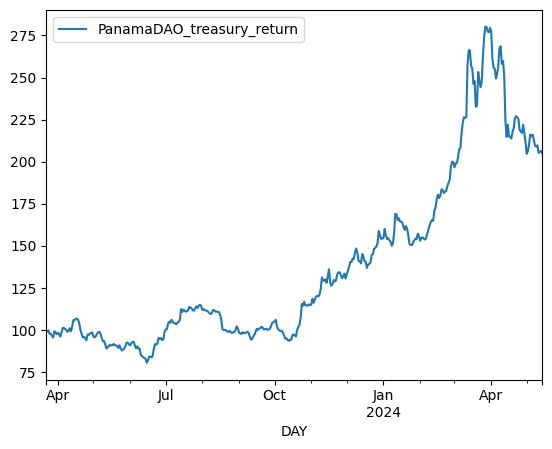

In [106]:
rl_normalized_returns.set_index('DAY', inplace=True)
rl_normalized_returns.plot()

# Comparing Historical Vs MVO Vs RL

## Daily Returns

In [107]:
rl_portfolio_returns

,Portfolio Return
2023-03-22,0.007459
2023-03-23,-0.009175
2023-03-24,0.007941
2023-03-25,-0.020675
2023-03-26,-0.000480
...,...
2024-05-10,0.003808
2024-05-11,-0.021411
2024-05-12,0.002970
2024-05-13,0.002637


In [108]:
mvo_daily_portfolio_returns

DAY
2023-03-22    0.000000
2023-03-23   -0.009175
2023-03-24    0.001977
2023-03-25   -0.020586
2023-03-26    0.007832
                ...   
2024-05-10    0.023365
2024-05-11   -0.020659
2024-05-12    0.010521
2024-05-13   -0.007532
2024-05-14   -0.009545
Length: 420, dtype: float64

In [109]:
historical_returns

DAY
2023-03-22    0.000000
2023-03-23    0.045793
2023-03-24   -0.033298
2023-03-25   -0.008316
2023-03-26    0.016688
                ...   
2024-05-11    0.001765
2024-05-12    0.005112
2024-05-13    0.005214
2024-05-14   -0.021892
2024-05-15    0.046896
Name: weighted_daily_return, Length: 421, dtype: float64

### Sortino Ratios

In [110]:
def calculate_sortino_ratio(returns, risk_free=current_risk_free):
    returns = pd.Series(returns)
    daily_risk_free_rate = (1 + risk_free) ** (1/365) - 1

    excess_returns = returns - daily_risk_free_rate
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    daily_downside_deviation = np.sqrt(downside_returns.mean())

    if np.isnan(daily_downside_deviation):
        daily_downside_deviation = 0.0

    active_days = returns.notna().sum()
    annual_factor = 365 / active_days
    compounding_return = (1 + excess_returns).prod() ** annual_factor - 1
    annual_downside_deviation = daily_downside_deviation * np.sqrt(365)

    sortino_ratio = compounding_return / annual_downside_deviation if annual_downside_deviation != 0 else 0.0
    
    if np.isinf(sortino_ratio) or sortino_ratio > 1000:
        sortino_ratio = 0.0
        print("Unusual Sortino ratio detected, setting to 0.0")
        
    print('sortino ratio', sortino_ratio)
    return sortino_ratio, compounding_return

sortino(historical_returns.values)

In [111]:
historical_sortino, historical_excess_return = calculate_sortino_ratio(historical_returns.values)

sortino ratio 1.0277436539358162


sortino(mvo_daily_portfolio_returns.values)

In [112]:
mvo_sortino, mvo_excess_return = calculate_sortino_ratio(mvo_daily_portfolio_returns.values)

sortino ratio 2.092471414399165


In [113]:
sortino(rl_portfolio_returns.values)

Sortino Ratio: 2.031706079026015


2.031706079026015

In [114]:
rl_sortino, rl_excess_return = calculate_sortino_ratio(rl_portfolio_returns['Portfolio Return'].values)

sortino ratio 3.189714820370298


## Cumulative Returns

In [115]:
rl_cumulative_return

,Portfolio Return
2023-03-22,0.007459
2023-03-23,-0.001785
2023-03-24,0.006142
2023-03-25,-0.014660
2023-03-26,-0.015133
...,...
2024-05-10,1.105343
2024-05-11,1.060266
2024-05-12,1.066386
2024-05-13,1.071835


In [116]:
mvo_cumulative_return

DAY
2023-03-22    0.000000
2023-03-23   -0.009175
2023-03-24   -0.007217
2023-03-25   -0.027654
2023-03-26   -0.020039
                ...   
2024-05-10    1.003715
2024-05-11    0.962319
2024-05-12    0.982966
2024-05-13    0.968030
2024-05-14    0.949245
Length: 420, dtype: float64

In [117]:
historical_cumulative_return

DAY
2023-03-22    0.000000
2023-03-23    0.046858
2023-03-24    0.012573
2023-03-25    0.004187
2023-03-26    0.021086
                ...   
2024-05-11    0.667624
2024-05-12    0.676172
2024-05-13    0.684934
2024-05-14    0.648449
2024-05-15    0.727596
Name: cumulative_return, Length: 421, dtype: float64

## Normalized Returns

In [118]:
rl_normalized_returns

,PanamaDAO_treasury_return
DAY,
2023-03-22,100.000000
2023-03-23,99.075608
2023-03-24,99.868317
2023-03-25,97.788103
2023-03-26,97.740842
...,...
2024-05-10,209.788380
2024-05-11,205.280722
2024-05-12,205.892684


In [119]:
mvo_normalized_returns

,PanamaDAO_treasury_return
DAY,
2023-03-22,100.000000
2023-03-23,99.082452
2023-03-24,99.278317
2023-03-25,97.234602
2023-03-26,97.996140
...,...
2024-05-10,200.371452
2024-05-11,196.231933
2024-05-12,198.296578


In [120]:
historical_normalized_returns

,PanamaDAO_treasury_return
DAY,
2023-03-22,100.000000
2023-03-23,104.685779
2023-03-24,101.257342
2023-03-25,100.418732
2023-03-26,102.108572
...,...
2024-05-11,166.762449
2024-05-12,167.617162
2024-05-13,168.493424


In [121]:
indicies_path = '../data/index.csv'
indicies = pd.read_csv(indicies_path)
indicies.set_index('DAY', inplace=True)
indicies.dropna(inplace=True)
index_start = indicies.index[-1]
index_start
indicies

,DEFI_TREASURY_INDEX,NON_DEFI_TREASURY_INDEX,SIRLOIN_INDEX,WBTC_NORMALIZED_PRICE,WBTC_DAILY_RETURN,WETH_NORMALIZED_PRICE,WETH_DAILY_RETURN
DAY,,,,,,,
2024-05-27 00:00:00.000,301.334817,163.396460,162.449114,224.353601,0.002169,199.579742,0.027130
2024-05-26 00:00:00.000,300.257979,161.822517,161.352003,223.867991,0.000156,194.308111,0.015177
2024-05-25 00:00:00.000,300.114118,159.395349,159.249399,223.833131,0.015639,191.403100,0.004336
2024-05-24 00:00:00.000,297.159986,158.784534,158.803393,220.386569,-0.012690,190.576808,-0.016113
2024-05-23 00:00:00.000,296.731154,159.758788,159.743390,223.219160,-0.016382,193.697878,0.010369
...,...,...,...,...,...,...,...
2023-07-07 00:00:00.000,96.904798,97.600896,98.352073,97.919065,-0.010477,95.125652,-0.022174
2023-07-06 00:00:00.000,95.610971,97.396848,97.921301,98.955817,-0.003224,97.282814,-0.009450
2023-07-05 00:00:00.000,98.040628,98.682808,99.660061,99.275909,-0.012288,98.210907,-0.015650


In [122]:
def normalize(data, date):
    # Convert Series to DataFrame and ensure it has a 'cumulative_return' column
    if isinstance(data, pd.Series):
        data = data.to_frame(name='cumulative_return')
    else:
        data = data.rename(columns={'Portfolio Return': 'cumulative_return'})

    # Convert the DataFrame to reset index to allow slicing by position
    cumulative_return_df = data.reset_index()

    # Rename the index to 'DAY' if it doesn't already have that column
    if 'index' in cumulative_return_df.columns:
        cumulative_return_df = cumulative_return_df.rename(columns={'index': 'DAY'})

    # Convert the 'DAY' column to datetime if it's not already
    cumulative_return_df['DAY'] = pd.to_datetime(cumulative_return_df['DAY'])

    # Filter the DataFrame to start from the specified date
    cumulative_return_df = cumulative_return_df[cumulative_return_df['DAY'] >= pd.to_datetime(date)]
    
    # Prepare base return (use cumulative_return as the base)
    base_return = cumulative_return_df.copy().dropna()
    
    # Drop any existing columns and rename them
    base_return = base_return[['DAY', 'cumulative_return']].rename(columns={'cumulative_return': 'base_cumulative_return'})

    # Combine results
    combined = base_return.sort_values('DAY')
    
    # Normalize returns
    first_value = combined['base_cumulative_return'].iloc[0]  # Get the first value
    combined['treasury_return'] = 100 + (100 * (combined['base_cumulative_return'] - first_value))
    
    # Final output
    normalized_returns = combined[['DAY', 'treasury_return']]
    normalized_returns.set_index('DAY', inplace=True)
    
    return normalized_returns


In [123]:
rl_cumulative_return

,Portfolio Return
2023-03-22,0.007459
2023-03-23,-0.001785
2023-03-24,0.006142
2023-03-25,-0.014660
2023-03-26,-0.015133
...,...
2024-05-10,1.105343
2024-05-11,1.060266
2024-05-12,1.066386
2024-05-13,1.071835


In [124]:
index_historical_normalized = normalize(historical_cumulative_return, index_start)
index_rl_normalized = normalize(rl_cumulative_return, index_start)
index_mvo_normalized = normalize(mvo_cumulative_return, index_start)

In [125]:
index_mvo_normalized.rename(columns={'treasury_return':'MVO Treasury Robo Advisor Return'}, inplace=True)

In [126]:
index_rl_normalized.rename(columns={'treasury_return':'RL Treasury Robo Advisor Return'}, inplace=True)

In [127]:
index_historical_normalized.rename(columns={'treasury_return':'Historical PanamaDAO Treasury Return'}, inplace=True)

In [128]:
index_historical_normalized.index

DatetimeIndex(['2023-07-03', '2023-07-04', '2023-07-05', '2023-07-06',
               '2023-07-07', '2023-07-08', '2023-07-09', '2023-07-10',
               '2023-07-11', '2023-07-12',
               ...
               '2024-05-06', '2024-05-07', '2024-05-08', '2024-05-09',
               '2024-05-10', '2024-05-11', '2024-05-12', '2024-05-13',
               '2024-05-14', '2024-05-15'],
              dtype='datetime64[ns]', name='DAY', length=318, freq=None)

In [129]:
indicies.index = pd.to_datetime(indicies.index)
combined_indicies = indicies.merge(index_historical_normalized, left_index=True, right_index=True, how='inner')
combined_indicies = combined_indicies.merge(index_mvo_normalized, left_index=True, right_index=True, how='inner')
combined_indicies = combined_indicies.merge(index_rl_normalized, left_index=True, right_index=True, how='inner')

In [130]:
combined_indicies.columns

Index(['DEFI_TREASURY_INDEX', 'NON_DEFI_TREASURY_INDEX', 'SIRLOIN_INDEX',
       'WBTC_NORMALIZED_PRICE', 'WBTC_DAILY_RETURN', 'WETH_NORMALIZED_PRICE',
       'WETH_DAILY_RETURN', 'Historical PanamaDAO Treasury Return',
       'MVO Treasury Robo Advisor Return', 'RL Treasury Robo Advisor Return'],
      dtype='object')

In [131]:
combined_indicies.drop(columns=['WBTC_DAILY_RETURN','WETH_DAILY_RETURN','WBTC_NORMALIZED_PRICE','WETH_NORMALIZED_PRICE'], inplace=True)

In [132]:
def normalize_log_returns(data, date):
    # Convert the DataFrame to use 'DAY' as the index

    # Calculate log returns
    log_returns = np.log(data / data.shift(1)).dropna()

    # Calculate cumulative log returns
    cumulative_log_returns = log_returns.cumsum()

    # Convert cumulative log returns to cumulative simple returns
    cumulative_simple_returns = np.exp(cumulative_log_returns) - 1

    # Convert the DataFrame to reset index to allow slicing by position
    cumulative_return_df = cumulative_simple_returns.reset_index()
    
    return log_returns, cumulative_log_returns, cumulative_simple_returns


C:\Users\brandyns pc\AppData\Local\Temp\ipykernel_21216\761783901.py:15: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  rl_return = float(rl_cumulative_return.iloc[-1]) * 100


historical cumulative return 72.76%
rl cumulative return 105.85%
mvo cumulative return 94.92%


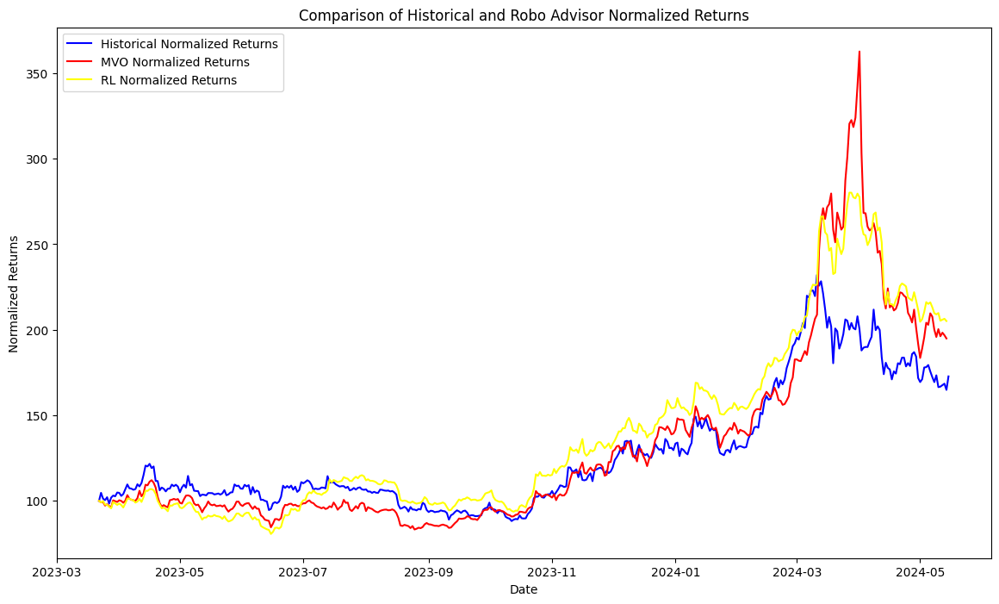

In [133]:

# Plot the comparison
plt.figure(figsize=(14, 8))
plt.plot(historical_normalized_returns.index, historical_normalized_returns['PanamaDAO_treasury_return'], label='Historical Normalized Returns', color='blue')
plt.plot(mvo_normalized_returns.index, mvo_normalized_returns['PanamaDAO_treasury_return'], label='MVO Normalized Returns', color='red')
plt.plot(rl_normalized_returns.index, rl_normalized_returns['PanamaDAO_treasury_return'], label='RL Normalized Returns', color='yellow')

# Add title and labels
plt.title('Comparison of Historical and Robo Advisor Normalized Returns')
plt.xlabel('Date')
plt.ylabel('Normalized Returns')
plt.legend()

# Extract the last values from each cumulative return Series
historical_return = float(historical_cumulative_return.iloc[-1]) * 100
rl_return = float(rl_cumulative_return.iloc[-1]) * 100
mvo_return = float(mvo_cumulative_return.iloc[-1]) * 100

# Convert the returns to strings and print
print(f'historical cumulative return {historical_return:.2f}%')
print(f'rl cumulative return {rl_return:.2f}%')
print(f'mvo cumulative return {mvo_return:.2f}%')

plt.show()


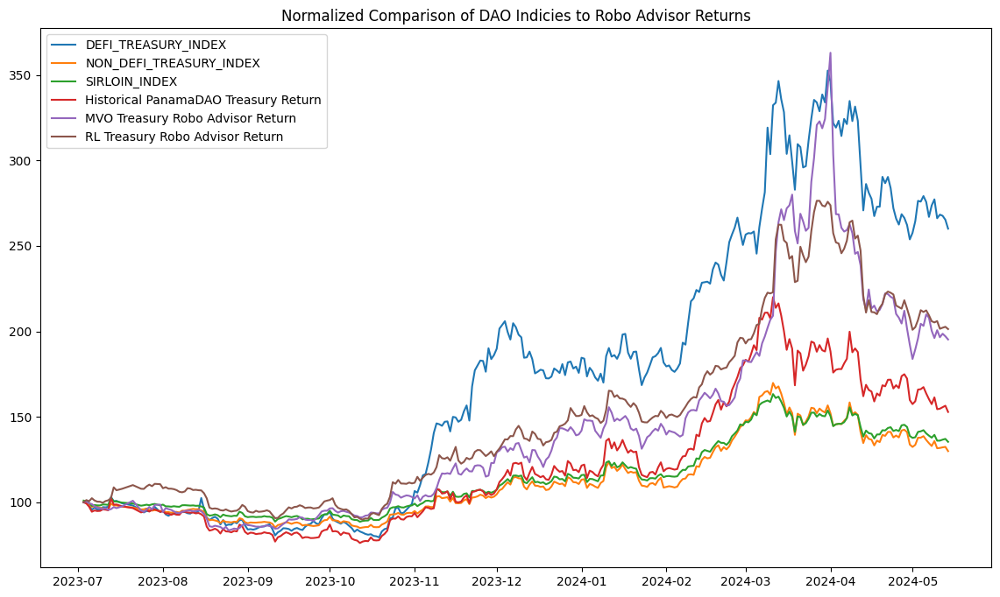

In [134]:
plt.figure(figsize=(14, 8))  # Adjust the width and height as needed
plt.plot(combined_indicies)
plt.legend(combined_indicies.columns)
plt.title('Normalized Comparison of DAO Indicies to Robo Advisor Returns')
plt.show()


In [135]:
latest_comp_mvo

COMPOSITION_COMP      0.0
COMPOSITION_CWBTC     0.0
COMPOSITION_DPI       0.0
COMPOSITION_ETH       0.2
COMPOSITION_GFI       0.2
COMPOSITION_MKR       0.3
COMPOSITION_PAXG      0.0
COMPOSITION_RETH      0.0
COMPOSITION_RPL       0.0
COMPOSITION_SOL       0.3
COMPOSITION_UNI       0.0
COMPOSITION_USDC      0.0
COMPOSITION_WBTC      0.0
COMPOSITION_WETH      0.0
COMPOSITION_WSTETH    0.0
Name: 2024-05-14 00:00:00, dtype: float64

In [136]:
latest_historical_comp

COMPOSITION_ETH     0.991463
COMPOSITION_USDC    0.008368
COMPOSITION_WETH    0.000169
Name: 2024-05-14 00:00:00, dtype: float64

In [137]:
latest_comp_rl

COMPOSITION_COMP      0.000000
COMPOSITION_CWBTC     0.114365
COMPOSITION_DPI       0.012875
COMPOSITION_ETH       0.200047
COMPOSITION_GFI       0.021732
COMPOSITION_MKR       0.106507
COMPOSITION_PAXG      0.014797
COMPOSITION_RETH      0.112172
COMPOSITION_RPL       0.073334
COMPOSITION_SOL       0.097092
COMPOSITION_UNI       0.000000
COMPOSITION_USDC      0.112827
COMPOSITION_WBTC      0.000000
COMPOSITION_WETH      0.112335
COMPOSITION_WSTETH    0.021918
Name: 2024-05-14 00:00:00, dtype: float64

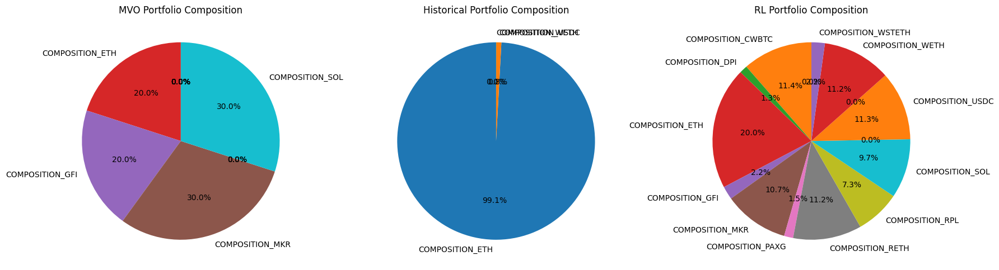

In [138]:

# Define a function to plot pie chart for MVO composition
def mvo_composition(ax): 
    latest_comp_mvo.plot.pie(autopct='%1.1f%%', startangle=90, ax=ax)
    ax.set_title('MVO Portfolio Composition')
    ax.set_ylabel('')  # Hide the y-label

# Define a function to plot pie chart for historical composition
def historical_composition(ax):
    latest_historical_comp.plot.pie(autopct='%1.1f%%', startangle=90, ax=ax)
    ax.set_title('Historical Portfolio Composition')
    ax.set_ylabel('')  # Hide the y-label

# Define a function to plot pie chart for RL composition
def rl_composition(ax):
    latest_comp_rl.plot.pie(autopct='%1.1f%%', startangle=90, ax=ax)
    ax.set_title('RL Portfolio Composition')
    ax.set_ylabel('')  # Hide the y-label

# Create subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

mvo_composition(axs[0])
historical_composition(axs[1])
rl_composition(axs[2])

plt.tight_layout()
plt.show()


## Market Comparisons - Beta

In [139]:
#!pip install scikit-learn

In [140]:
# Align the data sets by date
# Prepare data for linear regression

def calculate_beta(data, columnx, columny):
    X = data[f'{columnx}'].values.reshape(-1, 1)  # DPI returns
    Y = data[f'{columny}'].values  # MKR returns

    # Fit the linear regression model
    model = LinearRegression()
    model.fit(X, Y)

    # Output the beta
    beta = model.coef_[0]
    return beta


In [141]:
def calculate_cagr(history):
    initial_value = history.iloc[0]
    final_value = history.iloc[-1]
    number_of_years = (history.index[-1] - history.index[0]).days / 365.25

    cagr = (final_value / initial_value) ** (1 / number_of_years) - 1
    cagr_percentage = cagr * 100
    print(f"The CAGR is {cagr_percentage:.2f}%")
    return cagr

In [142]:
combined_indicies

,DEFI_TREASURY_INDEX,NON_DEFI_TREASURY_INDEX,SIRLOIN_INDEX,Historical PanamaDAO Treasury Return,MVO Treasury Robo Advisor Return,RL Treasury Robo Advisor Return
DAY,,,,,,
2024-05-14,260.069860,129.922678,135.358441,152.837638,195.243078,201.332415
2024-05-13,265.299990,132.407509,137.091076,156.486151,197.121576,202.669767
2024-05-12,267.617204,132.143216,136.642243,155.609889,198.615150,202.124885
2024-05-11,268.298039,131.778059,136.060338,154.755176,196.550505,201.512924
2024-05-10,266.186064,131.604205,136.023579,154.461019,200.690024,206.020582
...,...,...,...,...,...,...
2023-07-07,96.904798,97.600896,98.352073,95.202368,97.689335,101.040657
2023-07-06,95.610971,97.396848,97.921301,94.453813,98.954660,102.376280
2023-07-05,98.040628,98.682808,99.660061,97.418204,99.353564,100.627030


In [143]:
rl_beta = calculate_beta(combined_indicies, 'SIRLOIN_INDEX', 'RL Treasury Robo Advisor Return')
rl_cagr = calculate_cagr(combined_indicies['RL Treasury Robo Advisor Return'])
print(f"Beta: {rl_beta}")


The CAGR is 124.53%
Beta: 2.387977948497853


In [144]:
mvo_beta = calculate_beta(combined_indicies, 'SIRLOIN_INDEX', 'MVO Treasury Robo Advisor Return')
mvo_cagr = calculate_cagr(combined_indicies['MVO Treasury Robo Advisor Return'])
print(f"Beta: {mvo_beta}")


The CAGR is 116.70%
Beta: 2.574773164241592


In [145]:
historical_beta = calculate_beta(combined_indicies, 'SIRLOIN_INDEX', 'Historical PanamaDAO Treasury Return')
historical_cagr = calculate_cagr(combined_indicies['Historical PanamaDAO Treasury Return'])
print(f"Beta: {historical_beta}")


The CAGR is 63.28%
Beta: 1.7958740150277555


In [146]:
prices = pivot_assets.copy()
prices.set_index('DAY', inplace=True)
dpi_history = prices['DAILY_PRICE_DPI']

In [147]:
dpi_history.head()

DAY
2023-03-22    82.766938
2023-03-23    80.793823
2023-03-24    79.682526
2023-03-25    76.922269
2023-03-26    77.132662
Name: DAILY_PRICE_DPI, dtype: float64

In [148]:

dpi_cagr = calculate_cagr(dpi_history)
    
dpi_cumulative_risk_premium = dpi_cagr - current_risk_free
print('CAGR:', dpi_cagr)
print('Cumulative Risk Premium:',dpi_cumulative_risk_premium)

The CAGR is 34.91%
CAGR: 0.34906074252247543
Cumulative Risk Premium: 0.29666074252247543


In [149]:
#DEFI_TREASURY_INDEX

defi_index_history = combined_indicies['DEFI_TREASURY_INDEX']

defi_index_cagr = calculate_cagr(defi_index_history)
defi_index_cumulative_risk_premium = defi_index_cagr - current_risk_free
print('CAGR:', defi_index_cagr)
print('Cumulative Risk Premium:',defi_index_cumulative_risk_premium)

The CAGR is 201.84%
CAGR: 2.0184476146601207
Cumulative Risk Premium: 1.9660476146601207


In [150]:
#DEFI_TREASURY_INDEX

sirloin_history = combined_indicies['SIRLOIN_INDEX']

sirloin_cagr = calculate_cagr(sirloin_history)
sirloin_cumulative_risk_premium = sirloin_cagr - current_risk_free
print('CAGR:', sirloin_cagr)
print('Cumulative Risk Premium:',sirloin_cumulative_risk_premium)

The CAGR is 40.33%
CAGR: 0.4033147630433407
Cumulative Risk Premium: 0.3509147630433407


In [151]:
current_risk_free

0.0524

In [152]:
combined_indicies.columns

Index(['DEFI_TREASURY_INDEX', 'NON_DEFI_TREASURY_INDEX', 'SIRLOIN_INDEX',
       'Historical PanamaDAO Treasury Return',
       'MVO Treasury Robo Advisor Return', 'RL Treasury Robo Advisor Return'],
      dtype='object')

In [153]:
defi_index_cagr = calculate_cagr(combined_indicies['DEFI_TREASURY_INDEX'])
non_defi_index_cagr = calculate_cagr(combined_indicies['NON_DEFI_TREASURY_INDEX'])

defi_index_beta = calculate_beta(combined_indicies, 'SIRLOIN_INDEX', 'DEFI_TREASURY_INDEX')
non_defi_index_beta = calculate_beta(combined_indicies, 'SIRLOIN_INDEX', 'NON_DEFI_TREASURY_INDEX')



The CAGR is 201.84%
The CAGR is 35.33%


In [154]:
defi_index_beta

3.739551314263771

In [155]:
non_defi_index_beta

1.061773041755082

## Treynor Ratios

In [156]:
def calculate_treynor_ratio(log_returns, beta, risk_free=current_risk_free):
    """
    Calculate the Treynor ratio for a series of log returns.
    
    Args:
    - log_returns (pd.Series or np.array): Log returns of the portfolio.
    - beta (float): The beta of the portfolio.
    - risk_free (float): The risk-free rate (annualized).
    
    Returns:
    - float: Treynor ratio.
    """
    # Calculate the average log return
    avg_log_return = log_returns.mean()
    
    # Convert risk-free rate to daily log return
    daily_risk_free_log = np.log(1 + risk_free) / 365
    
    # Calculate the excess return
    excess_return = avg_log_return - daily_risk_free_log
    
    # Annualize the excess return
    annual_excess_return = excess_return * 365
    
    # Calculate the Treynor ratio
    treynor_ratio = annual_excess_return / beta
    
    print(f"Treynor Ratio: {treynor_ratio}")
    return treynor_ratio    

In [157]:
calculate_treynor_ratio(historical_returns.values,historical_beta)

Treynor Ratio: 0.23550282999368996


0.23550282999368996

In [158]:
calculate_treynor_ratio(mvo_daily_portfolio_returns.values,mvo_beta)

Treynor Ratio: 0.2556434535270535


0.2556434535270535

In [159]:
calculate_treynor_ratio(rl_portfolio_returns['Portfolio Return'].values,rl_beta)

Treynor Ratio: 0.2740270943362004


0.2740270943362004

## SML

In [160]:
def create_interactive_sml(risk_free_rate, market_risk_premium, rl_beta, mvo_beta, historical_beta, defi_beta, non_defi_beta, rl_return, mvo_return, historical_return, defi_return, non_defi_return):
        betas = np.linspace(0, 6, 100)
        expected_returns = risk_free_rate + betas * market_risk_premium
    
        # Create the SML line
        sml_line = go.Scatter(x=betas, y=expected_returns, mode='lines', name=f'SML')
    
        # Add MakerDAO token as points for expected (based on selected market risk premium) and actual returns
        rl_expected = go.Scatter(
            x=[rl_beta],
            y=[risk_free_rate + rl_beta * market_risk_premium],  # Use the selected market risk premium
            mode='markers', 
            marker=dict(color='red'),
            name=f'RL Expected'
        )
        
        rl_actual = go.Scatter(
            x=[rl_beta],
            y=[rl_return],
            mode='markers', 
            marker=dict(color='pink'),
            name=f'RL Actual'
        )
    
        # Add LidoDAO token as points for expected and actual returns
        mvo_expected = go.Scatter(
            x=[mvo_beta],
            y=[risk_free_rate + mvo_beta * market_risk_premium],  # Use the selected market risk premium
            mode='markers', 
            marker=dict(color='blue'),
            name=f'MVO Expected'
        )
        
        mvo_actual = go.Scatter(
            x=[mvo_beta],
            y=[mvo_return],
            mode='markers', 
            marker=dict(color='lightblue'),
            name=f'MVO Actual'
        )
    
        # Convert rpl_beta from array to scalar if necessary
        #rpl_beta_value = rpl_beta[0] if isinstance(rpl_beta, np.ndarray) else rpl_beta
    
        # Add Rocket Pool token as points for expected and actual returns
        historical_expected = go.Scatter(
            x=[historical_beta],
            y=[risk_free_rate + historical_beta * market_risk_premium],  # Use the selected market risk premium
            mode='markers',
            marker=dict(color='orange'),
            name='Historical Expected'
        )
        
        historical_actual = go.Scatter(
            x=[historical_beta],
            y=[historical_return],
            mode='markers',
            marker=dict(color='yellow'),
            name='Historical Actual'
        )
        
        defi_expected = go.Scatter(
            x=[defi_beta],
            y=[risk_free_rate + defi_beta * market_risk_premium],  # Use the selected market risk premium
            mode='markers',
            marker=dict(color='purple'),
            name='Defi Treasury Index Expected'
        )
        
        defi_actual = go.Scatter(
            x=[defi_beta],
            y=[defi_return],
            mode='markers',
            marker=dict(color='navy'),
            name='Defi Treasury Index Actual'
        )
        
        non_defi_expected = go.Scatter(
            x=[non_defi_beta],
            y=[risk_free_rate + non_defi_beta * market_risk_premium],  # Use the selected market risk premium
            mode='markers',
            marker=dict(color='grey'),
            name='Non-Defi Treasury Index Expected'
        )
        
        non_defi_actual = go.Scatter(
            x=[non_defi_beta],
            y=[non_defi_return],
            mode='markers',
            marker=dict(color='tan'),
            name='Non-Defi Treasury Index Actual'
        )
        
        
    
        # Add Risk-Free Rate line
        risk_free_line = go.Scatter(
            x=[0, max(betas)], 
            y=[risk_free_rate, risk_free_rate], 
            mode='lines', 
            line=dict(dash='dash', color='green'),
            name='Risk-Free Rate'
        )
    
        # Layout settings
        layout = go.Layout(
            title=f'SML',
            xaxis=dict(title='Beta (Systematic Risk)'),
            yaxis=dict(title='Return'),
            showlegend=True
        )
    
        # Combine all the plots
        fig = go.Figure(data=[sml_line, rl_expected, rl_actual, mvo_expected, mvo_actual, historical_expected, historical_actual, 
                              defi_expected, defi_actual, non_defi_expected,non_defi_actual, risk_free_line], layout=layout)
        return fig, market_risk_premium


In [161]:
historical_cagr

0.6328392347463665

In [162]:
fig, market_risk_premium = create_interactive_sml(
    current_risk_free,
    sirloin_cumulative_risk_premium,
    rl_beta,
    mvo_beta,
    historical_beta,
    defi_index_beta,
    non_defi_index_beta,
    rl_cagr,
    mvo_cagr,
    historical_cagr,
    defi_index_cagr,
    non_defi_index_cagr

    

)

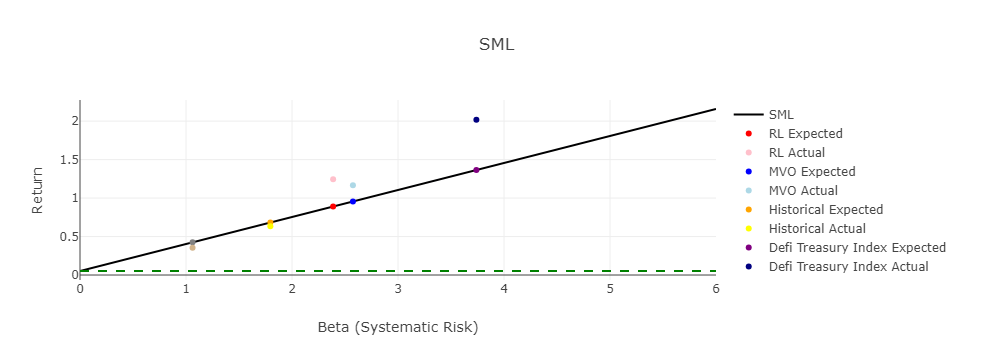

In [163]:
fig